## DATA SETUP

### Set up the basic data loading environment

In [ ]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

def load_data(in_path, name):
    df = pd.read_csv(in_path, encoding='latin1') # Added encoding='latin1'
    print(f"{name}: shape is {df.shape}")
    print(df.info())
    display(df.head(5))
    return df


datasets={}  # lets store the datasets in a dictionary so we can keep track of them easily

This code cell initializes the data analysis environment by importing essential Python libraries such as numpy, pandas, matplotlib.pyplot, and seaborn for data manipulation and visualization.

A function named load_data() is defined to load a CSV file using the specified path. The function prints the shape and info of the dataset. This function helps streamline the initial steps of data exploration.

In [ ]:
from IPython.display import display, HTML
pd.set_option("display.max_rows", None, "display.max_columns", None)

# Full stats

def stats_summary1(df, df_name):
    print(df.info(verbose=True )) # Changed from datasets[df_name].info
    print("-----"*15)
    print(f"Shape of the df {df_name} is {df.shape} \n")
    print("-----"*15)
    print(f"Statistical summary of {df_name} is :")
    print("-----"*15)
    print(f"Description of the df {df_name}:\n")
    print(display(HTML(np.round(df.describe(),2).to_html()))) # Changed from datasets['application_train'].describe
    #print(f"Description of the df {df_name}:\n",np.round(datasets['application_train'].describe(),2))

def stats_summary2(df, df_name):
    print(f"Description of the df continued for {df_name}:\n")
    print("-----"*15)
    print("Data type value counts: \n",df.dtypes.value_counts())
    print("\nReturn number of unique elements in the object. \n")
    print(df.select_dtypes('object').apply(pd.Series.nunique, axis = 0))


# List the categorical and Numerical features of a DF
def feature_datatypes_groups(df, df_name):
    df_dtypes = df.columns.to_series().groupby(df.dtypes).groups
    print("-----"*15)
    print(f"Categorical and Numerical(int + float) features  of {df_name}.")
    print("-----"*15)
    print()
    for k, v in df_dtypes.items():
        print({k.name: v})
        print("---"*10)
    print("\n \n")

# Null data list and plot.
def null_data_plot(df, df_name):
    percent = (df.isnull().sum()/df.isnull().count()*100).sort_values(ascending = False).round(2)
    sum_missing = df.isna().sum().sort_values(ascending = False)
    missing_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Train Missing Count"])
    missing_data=missing_data[missing_data['Percent'] > 0]
    print("-----"*15)
    print("-----"*15)
    print('\n The Missing Data: \n')
#     display(missing_data)  # display few
    if len(missing_data)==0:
      print("No missing Data")
    else:
      display(HTML(missing_data.to_html()))  # display all the rows
      print("-----"*15)
      if len(df.columns)> 35:
        f,ax =plt.subplots(figsize=(8,15))
      else:
        f,ax =plt.subplots()
      #plt.xticks(rotation='90')
      #fig=sns.barplot(missing_data.index, missing_data["Percent"],alpha=0.8)
      #plt.xlabel('Features', fontsize=15)
      #plt.ylabel('Percent of missing values', fontsize=15)
      plt.title(f'Percent missing data for {df_name}.', fontsize=10)
      fig=sns.barplot(x=missing_data["Percent"],y=missing_data.index ,alpha=0.8)
      plt.xlabel('Percent of missing values', fontsize=10)
      plt.ylabel('Features', fontsize=10)
      return missing_data


# Full consolidation of all the stats function.
def display_stats(df, df_name):
    print("--"*40)
    print(" "*20 + '\033[1m'+ df_name +  '\033[0m' +" "*20)
    print("--"*40)
    stats_summary1(df, df_name)

def display_feature_info(df, df_name):
    stats_summary2(df, df_name)
    feature_datatypes_groups(df, df_name)
    null_data_plot(df, df_name)

stats_summary1(df, df_name) function displays detailed metadata and basic statistics of the dataset, including column types, shape, and descriptive stats like mean, std, and percentiles for numeric columns. (Note: It currently uses application_train hardcoded—should be parameterized.)

stats_summary2(df, df_name) function shows data type counts and the number of unique values for each categorical (object-type) column, helping understand categorical feature diversity.

feature_datatypes_groups(df, df_name) groups and prints dataset columns by data type (e.g., int, float, object), helping identify categorical vs. numerical features.

null_data_plot(df, df_name) calculates and displays missing data per column as both a table and a horizontal bar chart. If no missing data exists, it notifies the user.

display_stats(df, df_name) function wraps the prints in a formatted title and runs stats_summary1() to display basic metadata and statistical info.

 display_feature_info(df, df_name) function runs stats_summary2(), feature_datatypes_groups(), and null_data_plot() for a complete overview of feature types and missing values.

## EDA

In [ ]:
file_path = '/content/sample_data/retail_data.xlsx'
df = pd.read_excel(file_path)
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2016-138688,2016-06-12,2016-06-16,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164


In [ ]:
df.columns

Index(['Row ID', 'Order ID', 'Order Date', 'Ship Date', 'Ship Mode',
       'Customer ID', 'Customer Name', 'Segment', 'Country', 'City', 'State',
       'Postal Code', 'Region', 'Product ID', 'Category', 'Sub-Category',
       'Product Name', 'Sales', 'Quantity', 'Discount', 'Profit'],
      dtype='object')

In [ ]:
display_feature_info(df, 'Retail_data')

Description of the df continued for Retail_data:

---------------------------------------------------------------------------
Data type value counts: 
 object            13
int64              3
float64            3
datetime64[ns]     2
Name: count, dtype: int64

Return number of unique elements in the object. 

Order ID         5009
Ship Mode           4
Customer ID       793
Customer Name     793
Segment             3
Country             1
City              531
State              49
Region              4
Product ID       1862
Category            3
Sub-Category       17
Product Name     1850
dtype: int64
---------------------------------------------------------------------------
Categorical and Numerical(int + float) features  of Retail_data.
---------------------------------------------------------------------------

{'int64': Index(['Row ID', 'Postal Code', 'Quantity'], dtype='object')}
------------------------------
{'datetime64[ns]': Index(['Order Date', 'Ship Date'], dtype='object

The Retail_data dataset contains 21 columns, including 15 categorical (object), 3 integer (int64), and 3 float (float64) features. Categorical columns such as Order ID, Customer ID, and Product ID have high cardinality, while others like Ship Mode, Segment, and Category have only a few unique values, indicating they are suitable for grouping or encoding. Numerical features include Row ID, Postal Code, Quantity, Sales, Discount, and Profit. The dataset is well-structured with no missing values, making it ready for analysis without the need for imputation or data cleaning.

In [ ]:
# Numerical summary

print("\nSummary statistics:")
display(df.describe())

# Count of missing values
print("\nMissing values:")
print(df.isnull().sum())

# Data types
print("\nData types:")
print(df.dtypes)



Summary statistics:


,Row ID,Order Date,Ship Date,Postal Code,Sales,Quantity,Discount,Profit
count,9994.000000,9994,9994,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000
mean,4997.500000,2016-04-30 00:07:12.259355648,2016-05-03 23:06:58.571142912,55190.379428,229.858001,3.789574,0.156203,28.656896
min,1.000000,2014-01-03 00:00:00,2014-01-07 00:00:00,1040.000000,0.444000,1.000000,0.000000,-6599.978000
25%,2499.250000,2015-05-23 00:00:00,2015-05-27 00:00:00,23223.000000,17.280000,2.000000,0.000000,1.728750
50%,4997.500000,2016-06-26 00:00:00,2016-06-29 00:00:00,56430.500000,54.490000,3.000000,0.200000,8.666500
75%,7495.750000,2017-05-14 00:00:00,2017-05-18 00:00:00,90008.000000,209.940000,5.000000,0.200000,29.364000
max,9994.000000,2017-12-30 00:00:00,2018-01-05 00:00:00,99301.000000,22638.480000,14.000000,0.800000,8399.976000
std,2885.163629,NaN,NaN,32063.693350,623.245101,2.225110,0.206452,234.260108



Missing values:
Row ID           0
Order ID         0
Order Date       0
Ship Date        0
Ship Mode        0
Customer ID      0
Customer Name    0
Segment          0
Country          0
City             0
State            0
Postal Code      0
Region           0
Product ID       0
Category         0
Sub-Category     0
Product Name     0
Sales            0
Quantity         0
Discount         0
Profit           0
dtype: int64

Data types:
Row ID                    int64
Order ID                 object
Order Date       datetime64[ns]
Ship Date        datetime64[ns]
Ship Mode                object
Customer ID              object
Customer Name            object
Segment                  object
Country                  object
City                     object
State                    object
Postal Code               int64
Region                   object
Product ID               object
Category                 object
Sub-Category             object
Product Name             object
Sales         

The Retail_data dataset contains 9,994 entries with no missing values across any of the 21 columns. It includes a mix of data types: 15 categorical (object), 3 integers (int64), and 3 floats (float64). Numerical features like Sales, Profit, and Quantity show a wide range, with Sales reaching up to 22,638.48 and Profit ranging from -6,599.98 to 8,399.98, indicating potential outliers. The dataset is clean and well-structured, making it suitable for immediate exploratory analysis and modeling.

### Distribution of numerical and categorical features

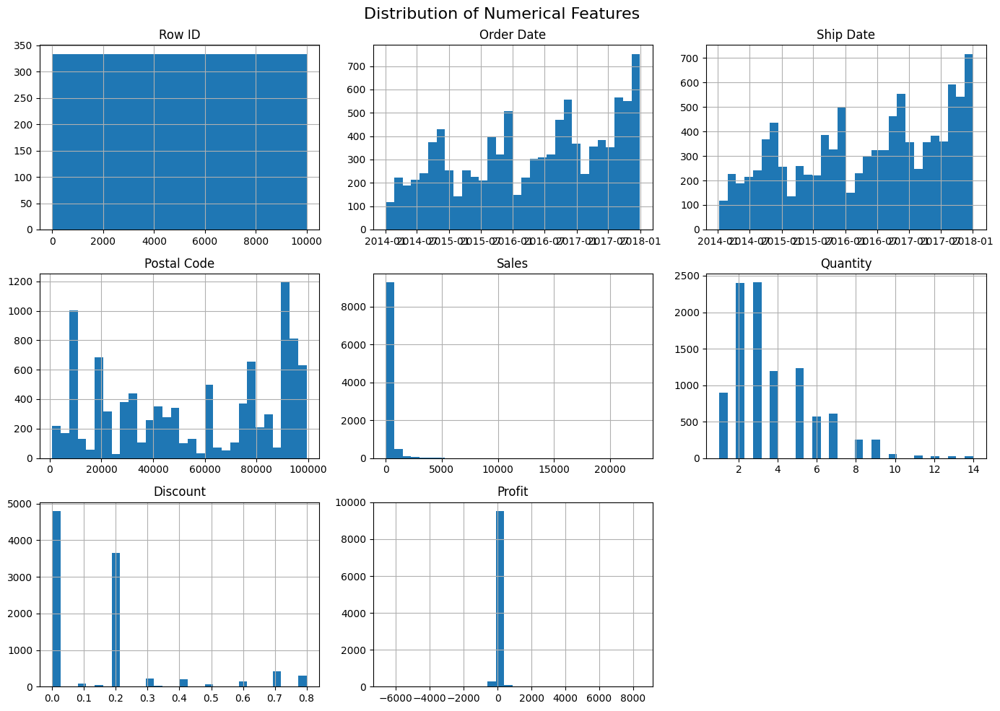

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histogram for numerical columns
df.hist(figsize=(14, 10), bins=30)
plt.suptitle("Distribution of Numerical Features", fontsize=16)
plt.tight_layout()
plt.show()

Top Row:

Row ID plot shows a uniform distribution, which is expected since Row ID likely represents a unique sequential identifier for each row. It doesn't carry meaningful variance for analysis.

Postal Code plot has the distribution which is highly uneven, with certain postal code ranges (e.g., near 0, 20,000, and 90,000) showing higher frequencies. This indicates sales concentration in specific geographic areas.

Middle Row:

Sales histogram plot is highly right-skewed. Most transactions have low sales values, while a few have extremely high amounts, possibly indicating outliers or large corporate purchases.

Quantity histogram is also right-skewed. Most orders involve small quantities (1–3 items), with few cases involving large quantities (up to 14), which could be bulk orders.

Bottom Row:

Discount plot displays a discrete distribution. Discounts are most commonly at 0%, 20%, and 70-80%, suggesting fixed discount tiers used in promotions or campaigns.

Profit plot is extremely right-skewed with some negative values. The majority of transactions yield modest profits, but some result in large losses (e.g., around -6,000), indicating potentially unprofitable transactions or returns.



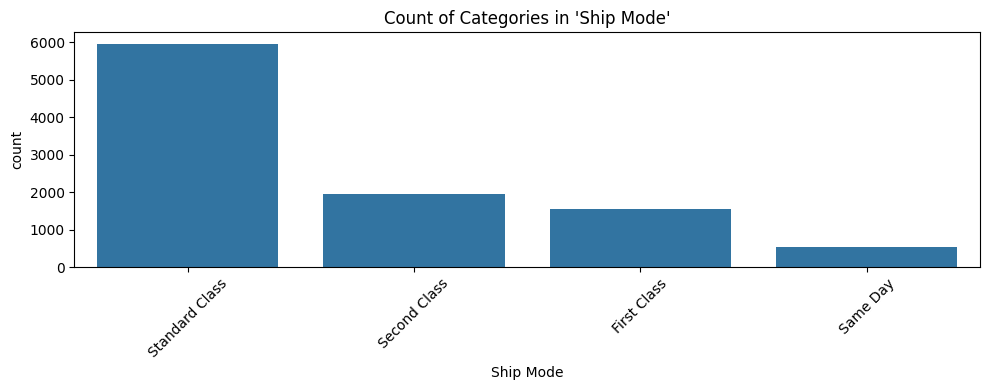

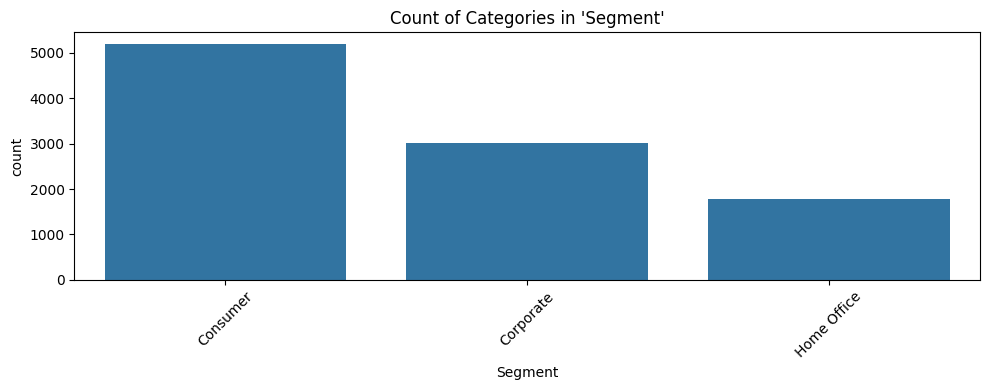

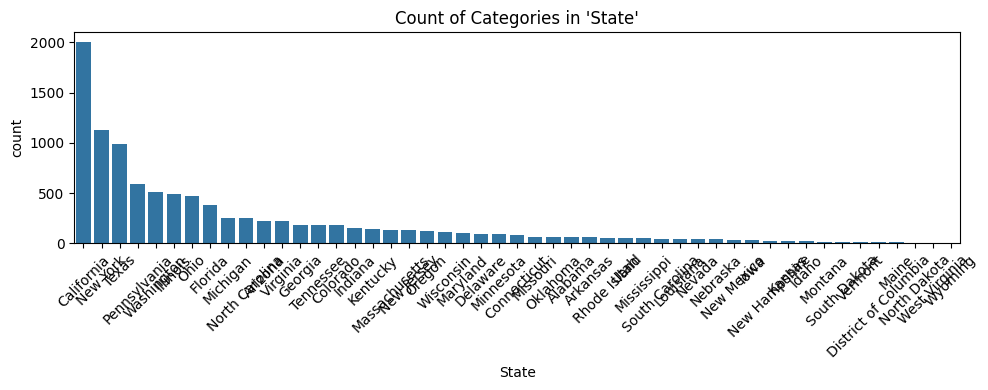

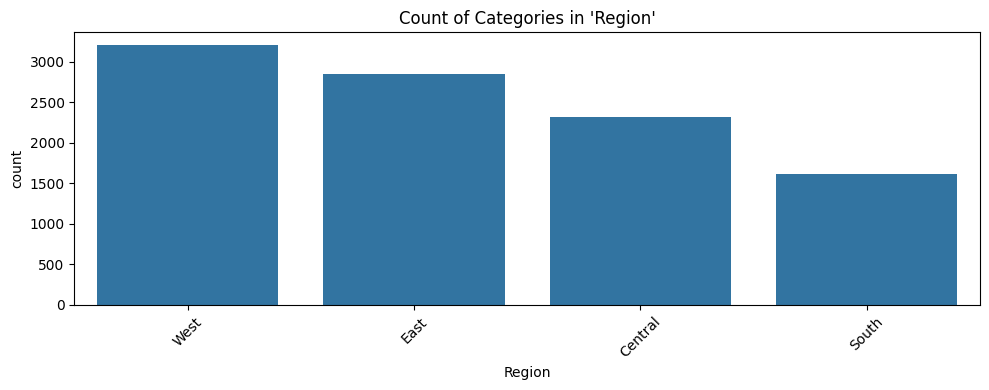

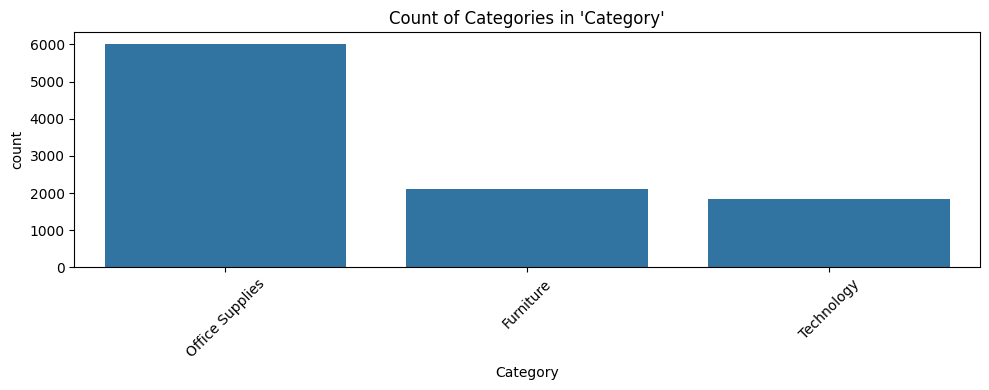

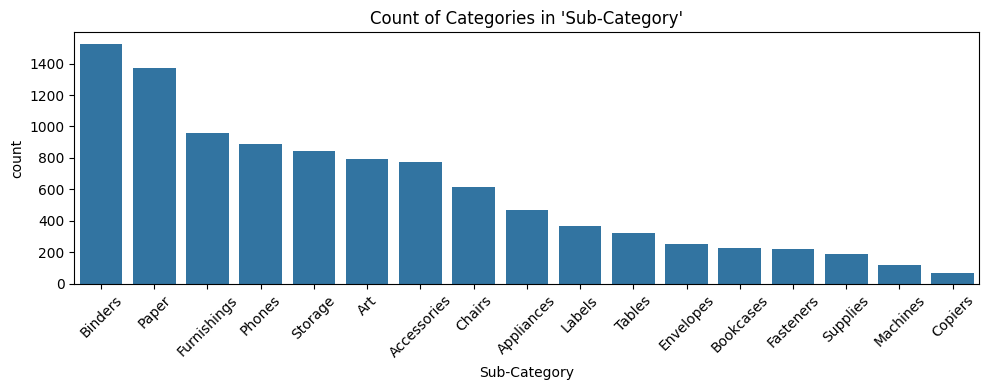

In [ ]:
# Countplot for categorical columns
categorical_cols = ['Ship Mode','Segment','State','Region','Category','Sub-Category',]
for col in categorical_cols:
    plt.figure(figsize=(10, 4))
    sns.countplot(data=df, x=col, order=df[col].value_counts().index)
    plt.title(f"Count of Categories in '{col}'")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

1. Ship Mode Distribution: This bar chart shows the count of orders across different shipping modes. Standard Class is by far the most frequently used shipping method, followed by Second Class and First Class, while Same Day shipping is used least frequently, indicating it may be reserved for urgent or premium orders.

2. Customer Segment Distribution: The plot illustrates the distribution of customer segments in the dataset. Consumer orders dominate the dataset, followed by Corporate and then Home Office, suggesting a primarily retail customer base.

3. State-wise Order Counts: This bar chart ranks states by the number of orders. California leads significantly, followed by New York and Texas, while several states like Wyoming and North Dakota have minimal order counts, pointing to regional concentration in sales.

4.  Regional Distribution: The chart displays the number of orders across U.S. regions. The West and East regions have the highest volume, while the South region has the lowest, which may correlate with population density or business presence.

5. The bar chart displays the distribution of records across the three main product categories in the Retail_data dataset: Office Supplies is the most frequent category, with around 6,000 entries, indicating it is the primary focus of the business.Furniture has approximately 2,100 records, showing moderate representation. Technology follows closely with just under 2,000 records.

6. Sub-Category Distribution: This visualization shows how orders are distributed across product sub-categories. Binders, Paper, and Furnishings are the most frequently ordered items, while Copiers and Machines are the least, possibly due to their higher cost or lower turnover rate.

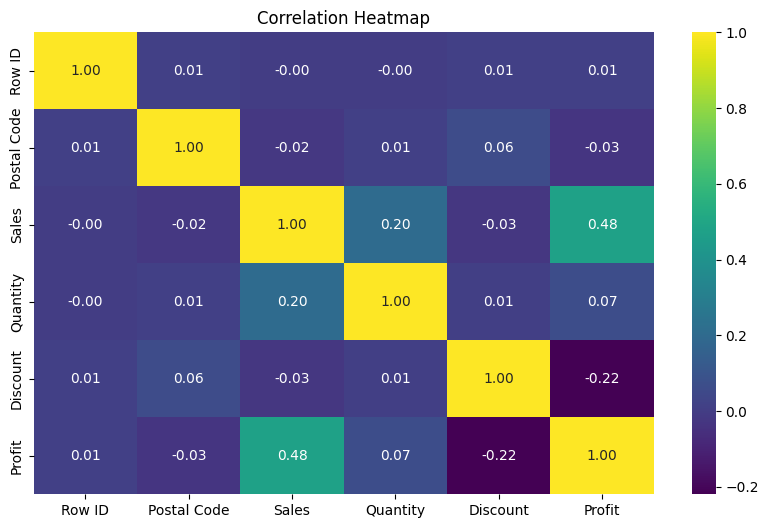

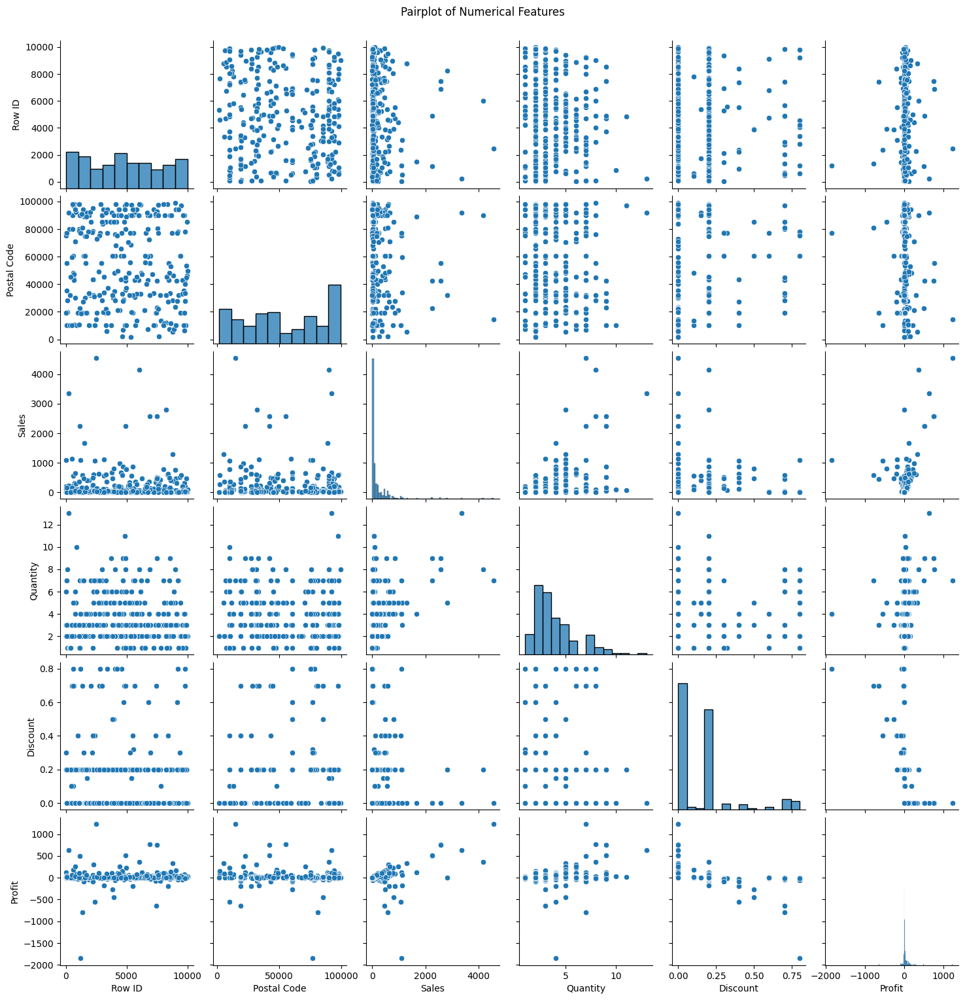

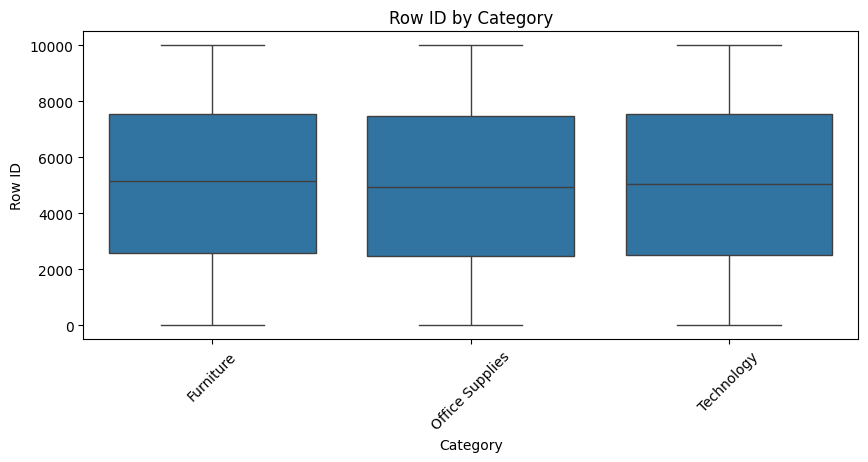

In [ ]:
# Correlation heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='viridis', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

# Pairplot (for a sample if large)
sample_df = df.sample(n=300, random_state=42) if len(df) > 300 else df
sns.pairplot(sample_df, diag_kind="hist")
plt.suptitle("Pairplot of Numerical Features", y=1.02)
plt.show()

# Boxplot of numerical variable vs. category
if 'Category' in df.columns and df.select_dtypes(include='number').shape[1] > 0:
    num_col = df.select_dtypes(include='number').columns[0]
    plt.figure(figsize=(10, 4))
    sns.boxplot(data=df, x='Category', y=num_col)
    plt.title(f"{num_col} by Category")
    plt.xticks(rotation=45)
    plt.show()

This pairplot provides a matrix of scatterplots and histograms for the key numerical variables in the dataset—Row ID, Postal Code, Sales, Quantity, Discount, and Profit—helping to visually assess potential relationships and distributions.

Sales vs. Profit shows a noticeable spread with some correlation, but many high-sales entries still result in negative profits, indicating inconsistent profitability.

Discount vs. Profit displays a scattered pattern, with deeper discounts often associated with negative profits—supporting the idea that excessive discounting erodes margins.

Quantity vs. Sales has a moderately positive relationship, but the spread suggests that high sales are not always driven by quantity alone (unit price likely plays a role).

Histograms on the diagonal reveal skewed distributions: Sales and Profit are right-skewed with outliers. Discount is concentrated at specific levels (e.g., 0%, 20%, 30%) likely due to standard pricing tiers.Quantity shows peaks at small integers like 2, 3, and 5, indicating common order sizes.

No meaningful patterns are visible for Row ID or Postal Code, as expected—they are identifiers rather than analytical variables.

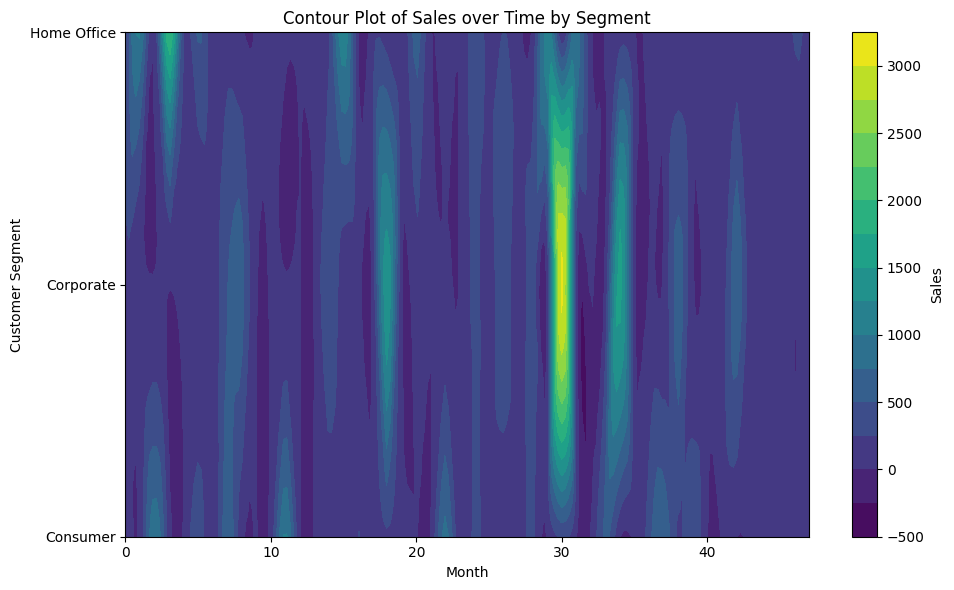

In [ ]:
from scipy.interpolate import griddata  # ✅ Import this

# Extract Month-Year from Order Date
df['OrderMonth'] = df['Order Date'].dt.to_period("M").astype(str)
df['MonthIndex'] = pd.factorize(df['OrderMonth'])[0]

# Factorize segments
df['SegmentIndex'], segment_names = pd.factorize(df['Segment'])

# Create grid data
x = df['MonthIndex']
y = df['SegmentIndex']
z = df['Sales']

# Create grid to interpolate
xi = np.linspace(x.min(), x.max(), 200)
yi = np.linspace(y.min(), y.max(), 200)
xi, yi = np.meshgrid(xi, yi)

# Interpolate
zi = griddata((x, y), z, (xi, yi), method='cubic')

# Plot
plt.figure(figsize=(10, 6))
contour = plt.contourf(xi, yi, zi, levels=15, cmap='viridis')
cbar = plt.colorbar(contour)
cbar.set_label('Sales')

# Label axes
plt.xlabel('Month')
plt.ylabel('Customer Segment')
plt.title('Contour Plot of Sales over Time by Segment')

# Replace Y-axis ticks with segment names
plt.yticks(ticks=np.arange(len(segment_names)), labels=segment_names)

plt.tight_layout()
plt.show()

This contour plot provides a visual representation of how sales volume varies over time across different customer segments. The x-axis represents time in months (based on order dates), while the y-axis shows the customer segments—Consumer, Corporate, and Home Office. The color gradient indicates the intensity of sales, with darker shades representing lower sales and brighter, yellow-green areas showing higher sales values.

From the plot, you can easily identify when and for which segment sales peaked. For example, bright spots in the middle of the plot indicate a period where one or more segments experienced significantly higher sales—likely corresponding to promotions, seasonal demand (like Q4), or strong campaign performance. This plot is particularly useful for detecting patterns, seasonality, or segment-specific surges in sales over time.

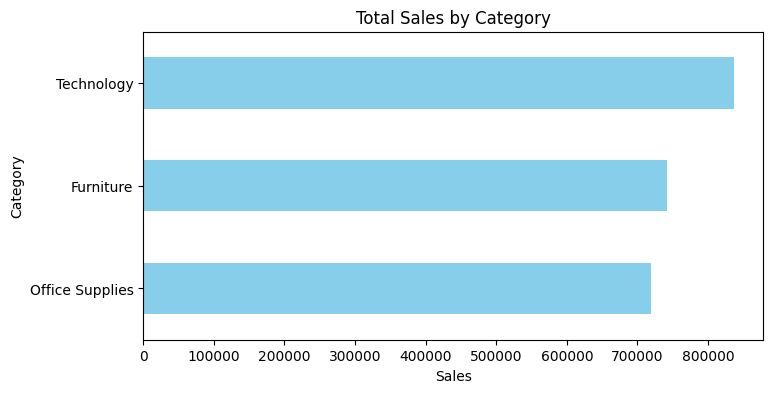

In [ ]:
# Sales by category (if applicable)
if 'Category' in df.columns and 'Sales' in df.columns:
    sales_by_cat = df.groupby('Category')['Sales'].sum().sort_values()
    sales_by_cat.plot(kind='barh', figsize=(8, 4), color='skyblue')
    plt.title("Total Sales by Category")
    plt.xlabel("Sales")
    plt.show()


The bar chart compares total sales across the three major product categories:

Technology leads with the highest total sales, exceeding $800,000, indicating strong demand for high-value items such as computers, printers, and accessories.

Office Supplies and Furniture follow closely behind, with each generating over $700,000 in total sales. This suggests they are significant contributors to revenue, though slightly trailing Technology.

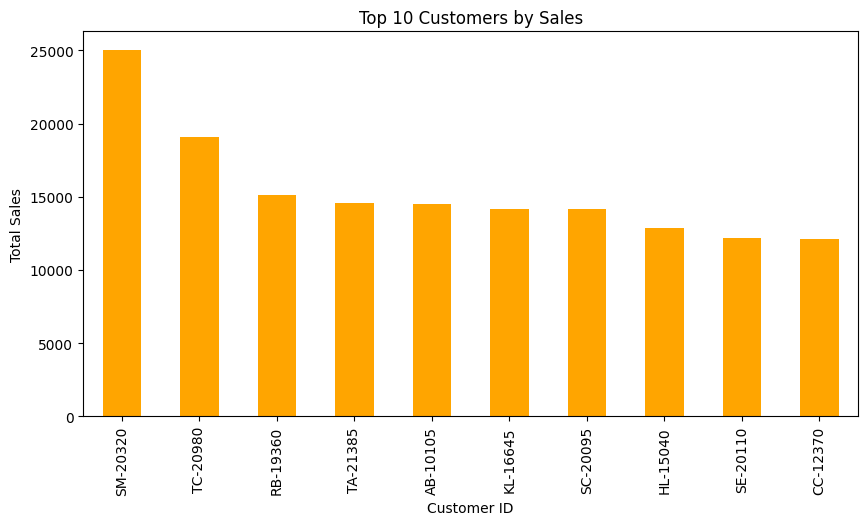

In [ ]:
# Top Customers
if 'Customer ID' in df.columns and 'Sales' in df.columns:
    top_customers = df.groupby('Customer ID')['Sales'].sum().sort_values(ascending=False).head(10)
    top_customers.plot(kind='bar', figsize=(10, 5), color='orange')
    plt.title("Top 10 Customers by Sales")
    plt.ylabel("Total Sales")
    plt.show()

The bar chart titled "Top 10 Customers by Sales" presents a visual representation of the highest spending customers based on total sales. Each bar corresponds to a unique customer ID, and the height of the bar indicates the total sales amount attributed to that customer. The customer with the highest sales is SM-20320, contributing over $25,000, followed by TC-20980 with nearly $19,000 in sales. The remaining customers each generated between approximately $12,000 and $15,000 in revenue. The chart effectively highlights the most valuable customers to the business, offering insights that can be used for strategic decision-making in customer relationship management, sales focus, and marketing efforts.

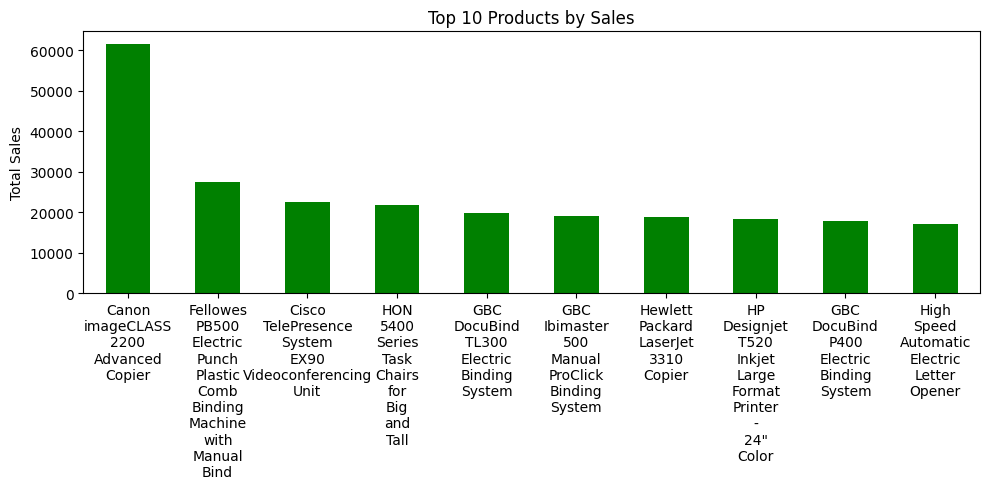

In [ ]:
if 'Product Name' in df.columns and 'Sales' in df.columns:
    top_products = df.groupby('Product Name')['Sales'].sum().sort_values(ascending=False).head(10)
    top_products.index = [label.replace(' ', '\n') for label in top_products.index]  # Split on space
    top_products.plot(kind='bar', figsize=(10, 5), color='green')
    plt.xticks(rotation=0)  # No need to rotate now
    plt.title("Top 10 Products by Sales")
    plt.ylabel("Total Sales")
    plt.tight_layout()
    plt.show()

The bar chart titled "Top 10 Products by Sales" highlights the products that generated the highest revenue. Each bar represents a product, with the height indicating the total sales amount. The Canon imageCLASS 2200 Advanced Copier stands out significantly as the top-selling product, bringing in over $
 $60,000  in sales, more than double the amount of the second-highest product. Following that, products like the Fellowes PB500 Electric Punch Plastic Comb Binding Machine with Manual Bind, Cisco TelePresence System EX90 Videoconferencing Unit, and HON 5400 Series Task Chairs for Big and Tall also show strong sales, ranging between $18,000 to $28,000. The rest of the products, including various binding systems, copiers, and printers, have fairly comparable sales figures just under $20,000. This chart is useful for identifying high-performing products, which can guide inventory decisions, promotional strategies, and future product investments.

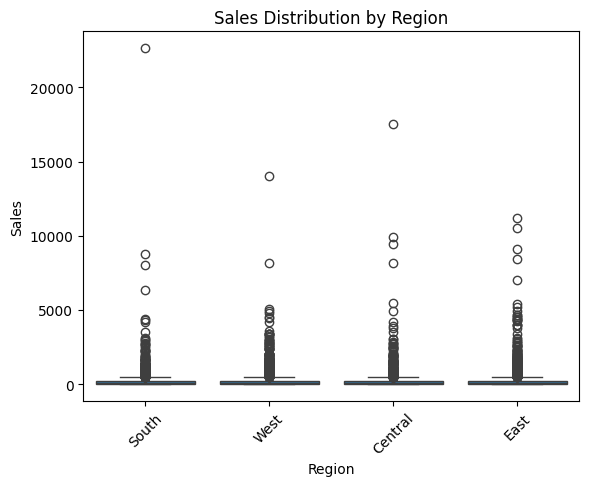

In [ ]:
# Sales per region
if 'Region' in df.columns and 'Sales' in df.columns:
    sns.boxplot(data=df, x='Region', y='Sales')
    plt.title("Sales Distribution by Region")
    plt.xticks(rotation=45)
    plt.show()

The box plot titled "Sales Distribution by Region" illustrates the spread and variability of sales across four different regions: South, West, Central, and East. Each region has a box plot that summarizes the distribution of individual sales values.

All four regions show a similar pattern, with most sales clustered toward the lower end, indicating that the majority of individual sales are relatively small. Outliers are present in all regions, representing significantly higher sales transactions. Notably, the South region has the largest outlier, reaching above $22,000.

The Central and East regions also have notable high-value outliers, while the West region shows a more compact distribution with slightly fewer extreme values.

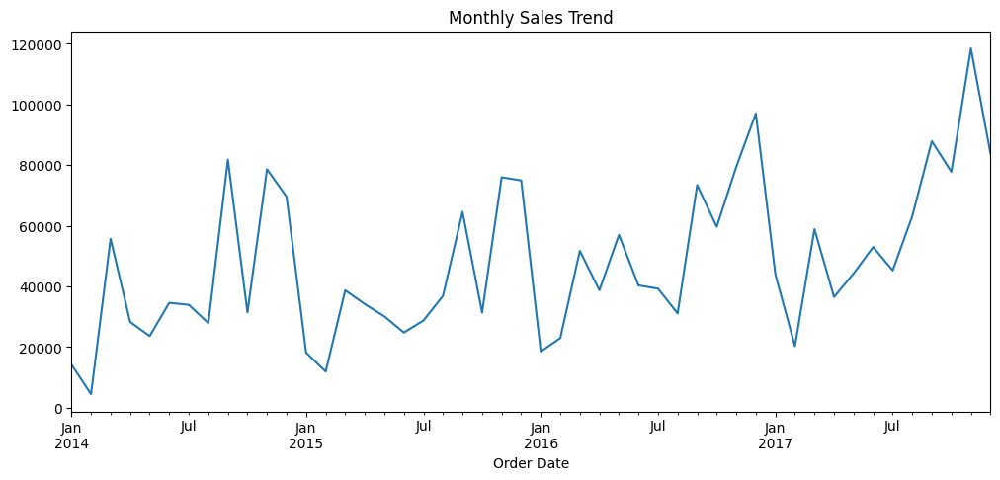

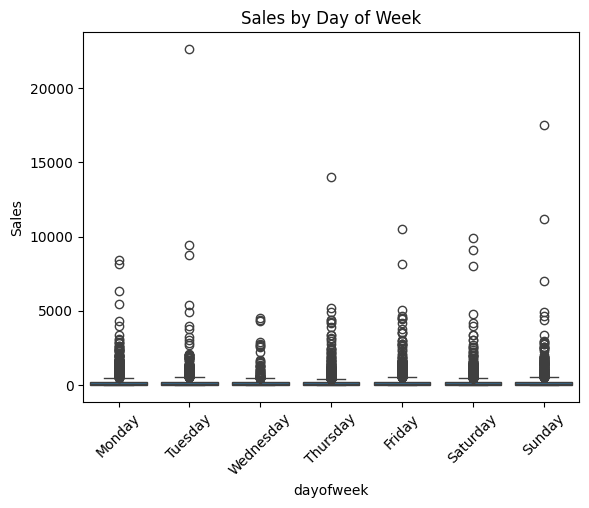

In [ ]:
# Check if there's a Date column
# if 'Order Date' in df.columns: # This check is no longer needed as 'Order Date' is the index
#     df['Order Date'] = pd.to_datetime(df['Order Date']) # This line is redundant
#     df.set_index('Order Date', inplace=True) # This line is redundant

# Monthly trend
df['Order Date'] = pd.to_datetime(df['Order Date'])
df.set_index('Order Date', inplace=True)

monthly_sales = df.resample('ME').sum(numeric_only=True)['Sales']
# monthly_sales.index = monthly_sales.index.to_timestamp() # Convert PeriodIndex to DatetimeIndex # This line is redundant
monthly_sales.plot(figsize=(12,5), title='Monthly Sales Trend')
plt.show() # Added plt.show()

# Sales by day of week
df['dayofweek'] = df.index.day_name()
sns.boxplot(data=df, x='dayofweek', y='Sales', order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
plt.title("Sales by Day of Week")
plt.xticks(rotation=45)
plt.show()

Monthly Sales Trend:
The line chart illustrates how sales have evolved month-over-month from early 2014 to late 2017. The trend is highly seasonal and volatile, with sharp peaks near the end of each year, likely driven by holiday shopping and Q4 business purchases. Despite fluctuations, there is a clear upward trajectory over time, suggesting overall growth in business performance. Sudden dips (e.g., early 2015 and 2017) might point to seasonal lulls or external disruptions.

Implication: Recognizing this pattern allows businesses to plan for inventory, marketing, and staffing ahead of high-sales months.

Sales by Day of Week: This strip + box plot reveals the distribution of sales volume across the days of the week: Tuesday and Sunday stand out with some of the highest outliers, although median sales remain relatively consistent across all days. Weekdays show higher density of sales, aligning with traditional business operations.Weekends (especially Sunday) have more extreme highs, possibly driven by consumer shopping behavior online or during promotions.

Insight: While average sales are fairly stable across days, certain days can deliver unusually high sales, warranting closer investigation into campaigns or customer behavior on those days.



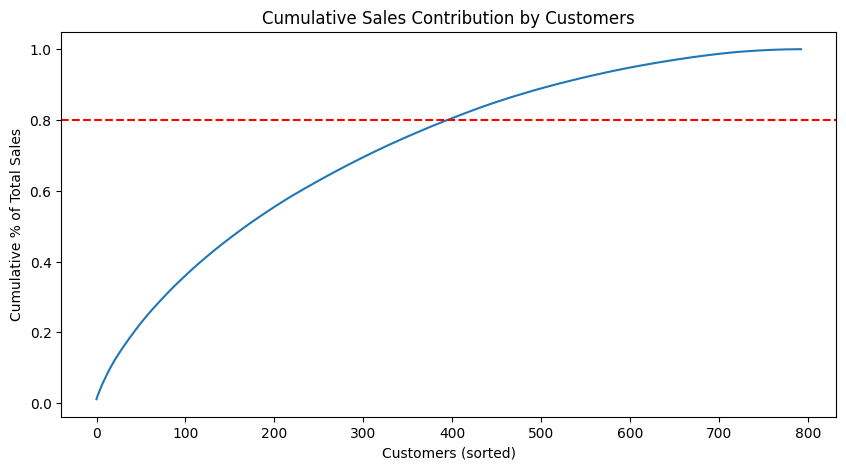

In [ ]:
# Pareto (80/20 rule): Which customers contribute to 80% of revenue?
customer_sales = df.groupby('Customer ID')['Sales'].sum().sort_values(ascending=False).reset_index()
customer_sales['cum_pct'] = customer_sales['Sales'].cumsum() / customer_sales['Sales'].sum()

plt.figure(figsize=(10,5))
sns.lineplot(x=customer_sales.index, y='cum_pct', data=customer_sales)
plt.axhline(0.8, color='red', linestyle='--')
plt.title("Cumulative Sales Contribution by Customers")
plt.xlabel("Customers (sorted)")
plt.ylabel("Cumulative % of Total Sales")
plt.show()


This curve displays the cumulative proportion of total sales contributed by customers, sorted from highest to lowest spender.The red dashed line marks the 80% threshold, illustrating the Pareto Principle (80/20 rule). Roughly 300 out of ~800 customers (≈37%) contribute to 80% of total sales, confirming that a small group of high-value customers drives the majority of revenue. The curve flattens toward the right, indicating that many customers contribute marginally to overall sales.

Insight: Businesses can prioritize retention and targeted strategies for top customers, while optimizing acquisition costs for the long tail.

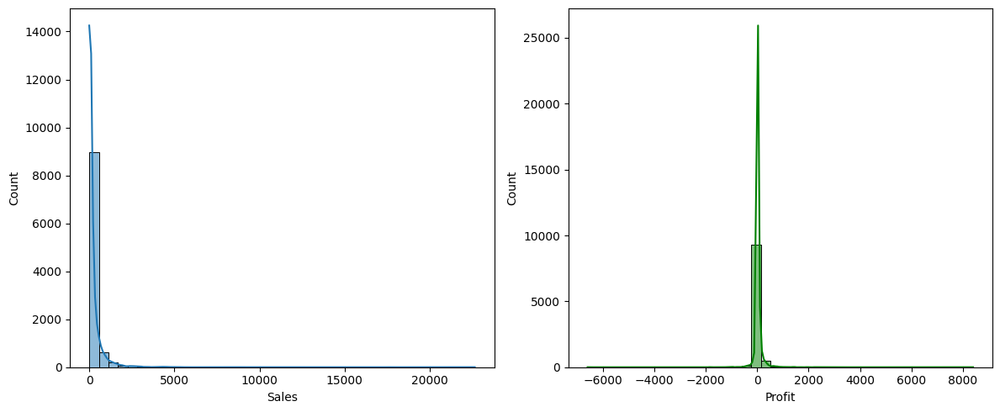

In [ ]:
plt.figure(figsize =(12,5))

plt.subplot(1,2,1)
sns.histplot(df['Sales'], bins = 40, kde = True)

plt.subplot(1,2,2)
sns.histplot(df['Profit'], kde = True, bins = 40, color='green')

plt.tight_layout()
plt.show()

Left Plot: Sales Distribution
The sales values are highly right-skewed, with the majority of transactions under 1,000 dollars. A long tail shows a few high-value sales (over 20,000 dollars), but these are outliers. Indicates that most sales are relatively small, but a few large transactions heavily impact revenue.

Right Plot: Profit Distribution
The profit distribution is sharply peaked around zero, with both positive and negative values. The presence of negative profits suggests loss-making transactions exist. This shape implies tight margins on many products, with some being highly unprofitable or deeply discounted.

Key Takeaway:
While the business generates a broad range of sales, profitability is more volatile, signaling the need for pricing strategy refinement and a deeper review of loss-making products or discount practices.



In [ ]:
print("Total Sales: $", round(df['Sales'].sum(), 2))
print("Total Profit: $", round(df['Profit'].sum(), 2))
print("Profit Margin: ", round(df['Profit'].sum() / df['Sales'].sum(), 2))

Total Sales: $ 2297200.86
Total Profit: $ 286397.02
Profit Margin:  0.12


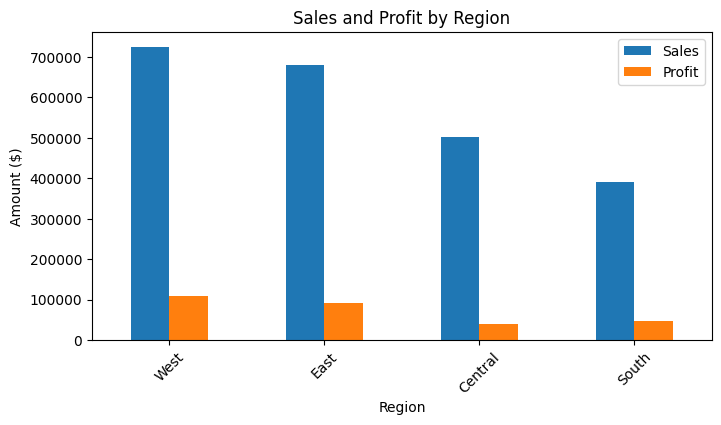

In [ ]:
#Sales and Profit by region:
region_performance = df.groupby('Region')[['Sales','Profit']].sum().sort_values(by='Sales', ascending =False)
region_performance.plot(kind='bar', figsize=(8,4), title ='Sales and Profit by Region')

plt.xlabel('Region')
plt.ylabel('Amount ($)')
plt.xticks(rotation=45)
plt.show()

Regional Sales and Profit Performance:

West region leads in both sales and profit, indicating strong market penetration and efficient operations.

East region follows closely in sales but generates slightly less profit, possibly due to higher operating costs or pricing pressure.

Central region shows moderate sales but significantly lower profit, raising concern about operational inefficiencies or discount-heavy strategies.

South has the lowest sales, yet its profit isn't proportionally low—this may reflect leaner operations or better margins.

Insight:
There’s a clear regional disparity in profitability, even when sales volumes are comparable. This emphasizes the importance of region-specific strategies in pricing, marketing, and logistics.

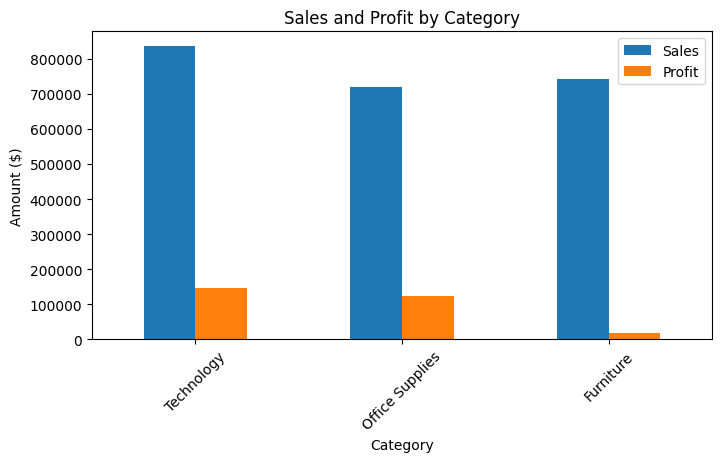

In [ ]:
##Category-wise analysis
category_performance = df.groupby('Category')[['Sales','Profit']].sum().sort_values(by='Profit', ascending =False)
category_performance.plot(kind='bar', figsize=(8,4), title ='Sales and Profit by Category')

plt.xlabel('Category')
plt.ylabel('Amount ($)')
plt.xticks(rotation=45)
plt.show()

Category-Level Sales and Profit Analysis:

Technology stands out with the highest sales and profit, indicating both strong demand and high margins—a key driver of overall profitability.

Office Supplies also performs well in both metrics, though slightly behind Technology, showing a balanced contribution.

Furniture, while comparable in sales, has very low profit, suggesting thin margins or high returns/discounts in this category.

Insight:
Despite similar sales levels, profitability varies drastically by category, highlighting the need to focus on high-margin categories (like Technology) and re-evaluate Furniture's pricing, procurement, or logistics strategies.

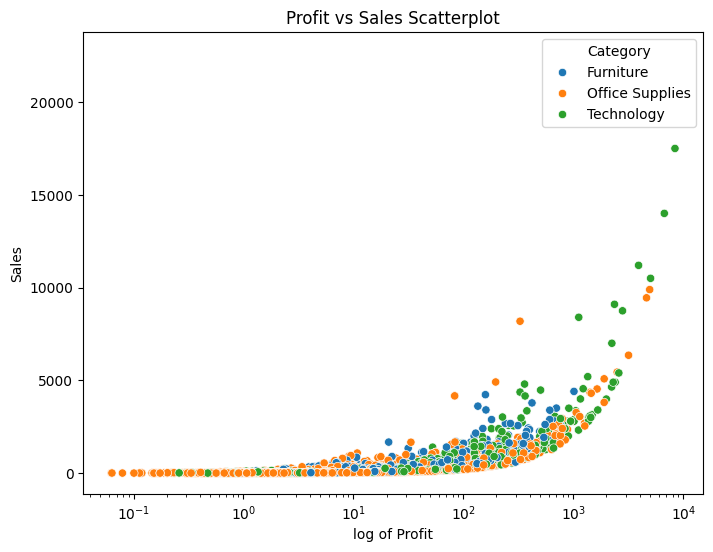

In [ ]:
## Profit vs Sales Scatterplot
plt.figure(figsize=(8,6))
sns.scatterplot(data=df, x='Profit', y ='Sales', hue='Category')
plt.title('Profit vs Sales Scatterplot')
plt.xscale('log')
plt.xlabel('log of Profit')
plt.ylabel('Sales')
plt.show()

Profit vs. Sales (Log Scale) by Category:

The scatterplot reveals a positive relationship between profit and sales across all product categories.

Technology (green) dominates the higher profit and sales spectrum, clustering more heavily in the upper-right quadrant—indicating high-value, high-margin transactions.

Furniture (blue) and Office Supplies (orange) exhibit denser clustering at lower profit ranges, with some sales activity but more scattered returns.

The logarithmic x-axis helps illustrate distributional spread in profit values, revealing long tails and sparse high-profit outliers.

Insight:
While sales generally increase with profit, the magnitude and consistency vary by category—Technology excels, while Furniture shows weaker profitability even at higher sales volumes, reaffirming earlier findings.

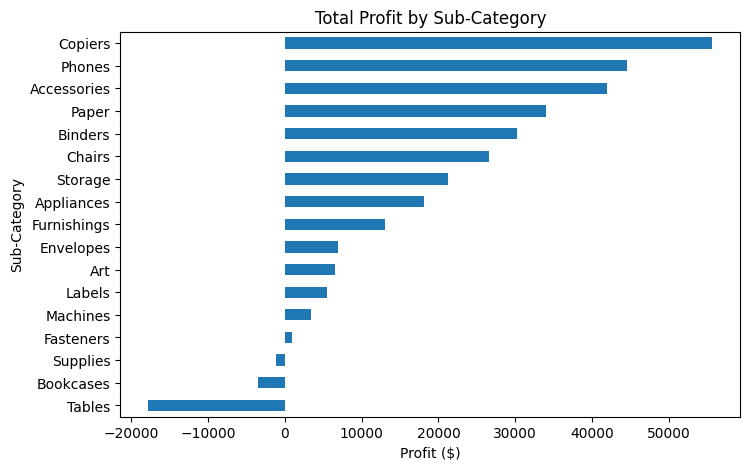

In [ ]:
## Aggregation by Category and Sub-Category to check High-level product group performance
category_agg = df.groupby(['Category', 'Sub-Category'])[['Sales', 'Profit', 'Discount']].sum().sort_values('Profit', ascending=False)
category_agg.head(5)

df.groupby('Sub-Category')['Profit'].sum().sort_values().plot(kind='barh', figsize=(8,5), title='Total Profit by Sub-Category')
plt.xlabel('Profit ($)')
plt.show()

Profitability by Sub-Category

Top-performing sub-categories include Copiers, Phones, Accessories, and Paper — all with strong positive profit, especially Copiers, which lead by a significant margin.

Moderately profitable sub-categories like Binders, Chairs, and Storage also contribute consistently to overall profit.

Unprofitable segments: Tables show notably large losses, followed by Bookcases, Supplies, and Fasteners—indicating potential pricing, cost, or demand issues.

Insight:
This chart highlights where strategic focus is needed: Copiers and Phones are clear revenue drivers and should be leveraged or expanded. Tables and Bookcases require attention—possibly through cost management, discount reductions, or phasing out low-margin SKUs.

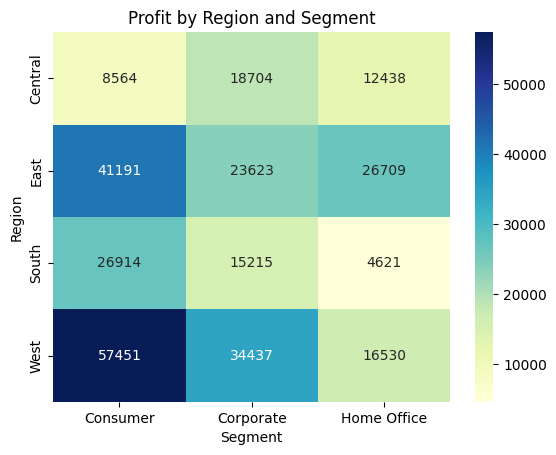

In [ ]:
##Multi-level Aggregation by Region + Segment to check the Targeted marketing opportunities
pivot_table = df.pivot_table(index='Region', columns='Segment', values='Profit', aggfunc='sum')

sns.heatmap(pivot_table, annot=True, fmt=".0f", cmap="YlGnBu")
plt.title('Profit by Region and Segment')
plt.show()

Profit by Region and Segment:

The West region dominates in profitability across all segments, with Consumer segment bringing the highest profit (57,451).

The East region also performs well, especially in the Consumer and Home Office segments.

The South region sees relatively low profit, particularly for the Home Office segment (4,621), which is the lowest value on the chart.

The Central region shows the most balanced but modest profit across all segments, without any standout performance.

Insight: Copiers, Phones, and Technology category items are clear profit drivers. The West region and Consumer segment are the strongest combination for profit generation. Tables, South–Home Office, and Furniture category underperform and present opportunities for strategic reevaluation or targeted improvement.

### Derived Columns

In [ ]:
df.columns

Index(['Row ID', 'Order ID', 'Ship Date', 'Ship Mode', 'Customer ID',
       'Customer Name', 'Segment', 'Country', 'City', 'State', 'Postal Code',
       'Region', 'Product ID', 'Category', 'Sub-Category', 'Product Name',
       'Sales', 'Quantity', 'Discount', 'Profit', 'dayofweek'],
      dtype='object')

In [ ]:
file_path = '/content/sample_data/retail_data.xlsx'
df = pd.read_excel(file_path)
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2016-138688,2016-06-12,2016-06-16,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164


In [ ]:
df['Shipping_Delay'] = (df['Ship Date'] - df['Order Date']).dt.days
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,OrderMonth,MonthIndex,SegmentIndex,RegionIndex,Shipping_Delay
0,1,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136,2016-11,0,0,0,3
1,2,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820,2016-11,0,0,0,3
2,3,CA-2016-138688,2016-06-12,2016-06-16,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714,2016-06,1,1,1,4
3,4,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310,2015-10,2,0,0,7
4,5,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164,2015-10,2,0,0,7


In [ ]:
df.shape

(9994, 22)

#### Financial Metrics
1. Profit Margin= Profit / Sales
2. Discounted Price =	Sales adjusted for discount =	Sales * (1 - Discount)
3. Revenue per Unit	= Sales / Quantity
4. Profit per Unit =	Profit / Quantity

In [ ]:
df['Profit_Margin'] = df['Profit'] / df['Sales']
df['Revenue_per_Unit'] = df['Sales'] / df['Quantity']
df['Profit_per_Unit'] = df['Profit'] / df['Quantity']
df['Discounted_Price'] = df['Sales'] * (1 - df['Discount'])

In [ ]:
df.shape

(9994, 26)

In [ ]:
## Log-Transformed Metrics
df['Log_Sales'] = np.log1p(df['Sales'])
df['Log_Profit'] = np.log1p(df['Profit'])

In [ ]:
## Proportional Sales for Sunburst
df['Sales_Prop_by_Category'] = df.groupby('Category')['Sales'].transform(lambda x: x / x.sum())

In [ ]:
## Extract Date Components
df['Order_Year'] = df['Order Date'].dt.year
df['Order_Month'] = df['Order Date'].dt.month
df['Order_Weekday'] = df['Order Date'].dt.day_name()

In [ ]:
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Shipping_Delay,Profit_Margin,Revenue_per_Unit,Profit_per_Unit,Discounted_Price,Log_Sales,Log_Profit,Sales_Prop_by_Category,Order_Year,Order_Month,Order_Weekday
0,1,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136,3,0.1600,130.9800,20.9568,261.960000,5.572002,3.759189,0.000353,2016,11,Tuesday
1,2,CA-2016-152156,2016-11-08,2016-11-11,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820,3,0.3000,243.9800,73.1940,731.940000,6.597064,5.396270,0.000986,2016,11,Tuesday
2,3,CA-2016-138688,2016-06-12,2016-06-16,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714,4,0.4700,7.3100,3.4357,14.620000,2.748552,2.063236,0.000020,2016,6,Sunday
3,4,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310,7,-0.4000,191.5155,-76.6062,526.667625,6.865450,NaN,0.001291,2015,10,Sunday
4,5,US-2015-108966,2015-10-11,2015-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164,7,0.1125,11.1840,1.2582,17.894400,3.151368,1.257438,0.000031,2015,10,Sunday


#### Customer Behavior Metrics

Customer_Lifetime_Sales = 	Total sales per customer

Customer_Lifetime_Profit= Total profit per customer

Avg_Discount_per_Customer	= Avg discount used =	Segment comparison / Chord

Purchase_Frequency =	Number of orders per customer	Histogram

In [ ]:
customer_metrics = df.groupby('Customer ID').agg({
    'Sales': 'sum',
    'Profit': 'sum',
    'Discount': 'mean',
    'Order ID': pd.Series.nunique
}).rename(columns={
    'Sales': 'Customer_Lifetime_Sales',
    'Profit': 'Customer_Lifetime_Profit',
    'Discount': 'Avg_Discount',
    'Order ID': 'Purchase_Frequency'
})
customer_metrics.head()

,Customer_Lifetime_Sales,Customer_Lifetime_Profit,Avg_Discount,Purchase_Frequency
Customer ID,,,,
AA-10315,5563.560,-362.8825,0.090909,5
AA-10375,1056.390,277.3824,0.080000,9
AA-10480,1790.512,435.8274,0.016667,4
AA-10645,5086.935,857.8033,0.063889,6
AB-10015,886.156,129.3465,0.066667,3


####  Category-Level Metrics

To evaluate how product categories and sub-categories perform in profitability, discount sensitivity, and logistics.

Avg_Profit_Margin_by_Category =	Profitability indicator

Avg_Discount_by_Category =	Effectiveness of discounting

Shipping_Delay_by_Category =	Ops insight by product type

Sales_Contribution_Percentage

In [ ]:
# First ensure base metrics exist
# df['Profit_Margin'] = df['Profit'] / df['Sales']
# df['Shipping_Delay'] = (df['Ship_Date'] - df['Order_Date']).dt.days

# Now aggregate
category_metrics = df.groupby(['Category', 'Sub-Category']).agg({
    'Sales': 'sum',
    'Profit': 'sum',
    'Discount': 'mean',
    'Profit_Margin': 'mean',
    'Shipping_Delay': 'mean'
}).reset_index()
category_metrics.head()

,Category,Sub-Category,Sales,Profit,Discount,Profit_Margin,Shipping_Delay
0,Furniture,Bookcases,114879.9963,-3472.5560,0.211140,-0.126640,3.811404
1,Furniture,Chairs,328449.1030,26590.1663,0.170178,0.043900,3.899514
2,Furniture,Furnishings,91705.1640,13059.1436,0.138349,0.137066,3.961338
3,Furniture,Tables,206965.5320,-17725.4811,0.261285,-0.147727,3.893417
4,Office Supplies,Appliances,107532.1610,18138.0054,0.166524,-0.156869,3.989270


In [ ]:
product_perf = df.groupby('Product Name').agg({
    'Sales': 'sum',
    'Profit': 'sum',
    'Quantity': 'sum',
    'Discount': 'mean',
    'Profit_Margin': 'mean',
    'Shipping_Delay': 'mean'
}).sort_values(by='Sales', ascending=False)
product_perf.head()

,Sales,Profit,Quantity,Discount,Profit_Margin,Shipping_Delay
Product Name,,,,,,
Canon imageCLASS 2200 Advanced Copier,61599.824,2.519993e+04,20,0.12,0.384667,4.000000
Fellowes PB500 Electric Punch Plastic Comb Binding Machine with Manual Bind,27453.384,7.753039e+03,31,0.24,0.050000,4.200000
Cisco TelePresence System EX90 Videoconferencing Unit,22638.480,-1.811078e+03,6,0.50,-0.080000,5.000000
HON 5400 Series Task Chairs for Big and Tall,21870.576,3.979039e-13,39,0.20,-0.014683,3.125000
GBC DocuBind TL300 Electric Binding System,19823.479,2.233505e+03,37,0.30,-0.084091,4.818182


In [ ]:
df.to_csv("final_df.csv", index=False)


In [ ]:
df.shape

(9994, 32)

## OBJECTIVES

### Objective 1 - Utilize descriptive and visual analytics to analyze a U.S. Office supply retail dataset.

Please refer the EDA section for all the visual analytics and their description


### Objective 2 -To identify high-performing and underperforming products based on sales and profit metrics

The code to create this objective can be found in the Objective_2_Scatterplot.pbix and Objective_2_Surnburst.ipynb

In [ ]:
product_perf = df.groupby("Product Name")[["Sales", "Profit"]].sum().reset_index()

# Determine thresholds
high_sales_thresh = product_perf["Sales"].quantile(0.75)
high_profit_thresh = product_perf["Profit"].quantile(0.75)
low_sales_thresh = product_perf["Sales"].quantile(0.25)
low_profit_thresh = product_perf["Profit"].quantile(0.25)


In [ ]:
# Define performance category
def classify_product(row):
    if row["Sales"] >= high_sales_thresh and row["Profit"] >= high_profit_thresh:
        return "High-Performing"
    elif row["Sales"] <= low_sales_thresh and row["Profit"] <= low_profit_thresh:
        return "Underperforming"
    elif row["Sales"] >= high_sales_thresh and row["Profit"] <= low_profit_thresh:
        return "Low Margin"
    elif row["Profit"] >= high_profit_thresh and row["Sales"] <= low_sales_thresh:
        return "High Profit, Low Sales"
    else:
        return "Moderate"

product_perf["Performance_Category"] = product_perf.apply(classify_product, axis=1)

In [ ]:
# Show top 10 high performers
product_perf[product_perf["Performance_Category"] == "High-Performing"].sort_values(by="Profit", ascending=False).head(5)

,Product Name,Sales,Profit,Performance_Category
404,Canon imageCLASS 2200 Advanced Copier,61599.824,25199.9280,High-Performing
650,Fellowes PB500 Electric Punch Plastic Comb Bin...,27453.384,7753.0390,High-Performing
805,Hewlett Packard LaserJet 3310 Copier,18839.686,6983.8836,High-Performing
400,Canon PC1060 Personal Laser Copier,11619.834,4570.9347,High-Performing
787,HP Designjet T520 Inkjet Large Format Printer ...,18374.895,4094.9766,High-Performing


In [ ]:
# Show underperformers
product_perf[product_perf["Performance_Category"] == "Underperforming"].sort_values(by="Profit").head(5)

,Product Name,Sales,Profit,Performance_Category
388,"Bush Westfield Collection Bookcases, Dark Cher...",90.882,-190.8522,Underperforming
562,Eldon Executive Woodline II Cherry Finish Desk...,98.136,-78.5088,Underperforming
696,GBC Plasticlear Binding Covers,68.880,-68.4208,Underperforming
925,Insertable Tab Post Binder Dividers,66.566,-39.6990,Underperforming
718,GBC VeloBinder Strips,52.992,-23.8080,Underperforming


In Power BI, we analyzed product-level performance by first importing a Superstore sales dataset. We created a new summarized table called ProductPerformance using DAX to aggregate total sales and total profit by product name. Next, we added a calculated column, Performance Category, that classified each product as "High-Performing," "Underperforming," "Low Margin," or "Moderate" based on sales and profit quartiles using percentile logic. To visualize this, we created a scatter chart plotting total sales on the X-axis and total profit on the Y-axis, using the performance category as the legend to distinguish products by color. We also displayed product names directly on the chart by enabling data labels and assigning "Product Name" to the Details field, allowing viewers to identify each product at a glance without hovering. This interactive visual enables quick identification of strong and weak products based on both revenue and profitability metrics.

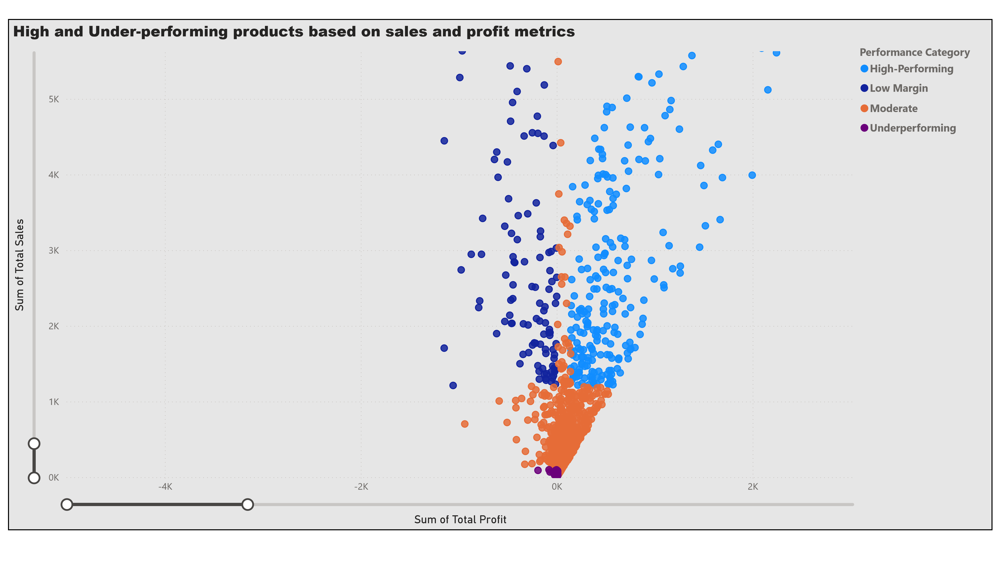

Identifying high-performing and underperforming products based on sales and profit metrics is a key aspect of data-driven business analysis. High-performing products typically generate strong sales revenue and healthy profit margins, indicating customer demand and effective pricing. In contrast, underperforming products may suffer from low sales, low profitability, or both,highlighting potential issues such as poor market fit, high costs, or excessive discounting. By analyzing these metrics together, businesses can prioritize which products to promote, improve, or phase out, ultimately driving better inventory management, marketing strategies, and profitability.

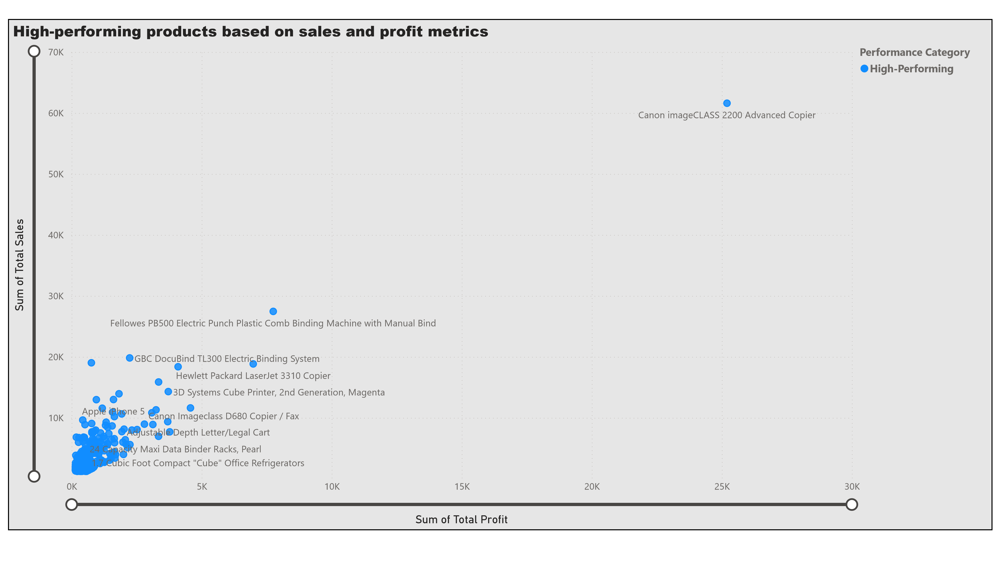

The analysis identified several standout products that significantly contribute to both revenue and profitability. These high-performing products had both total sales and profits above the 75th percentile, highlighting their strategic importance in the product portfolio.

Among the top performers:

Canon imageCLASS 2200 Advanced Copier stands out with an exceptional $61,599 in sales and 25,199 in profit, making it the most lucrative product in the dataset.

Fellowes PB500 Electric Punch Plastic Comb Binding Machine also performed strongly, with over $27,000 in sales and a healthy 7,753 in profit, indicating its popularity in office equipment.

HP and Canon laser copiers (e.g., HP LaserJet 3310, Canon PC1060) were consistently among the top, suggesting that high-end office printing and copying solutions are in strong demand and maintain solid margins.

3D Systems Cube Printer and HP Designjet T520 Large Format Printer both had high sales exceeding $14,000-18,000 with profit margins over 3,000dollars, highlighting customer interest in advanced printing technology like 3D and large-format printers.

Other office equipment like the Ativa Micro-Cut Shredder and Plantronics Wireless Headset also showed strong financial performance, reflecting demand for secure and high-tech office solutions.

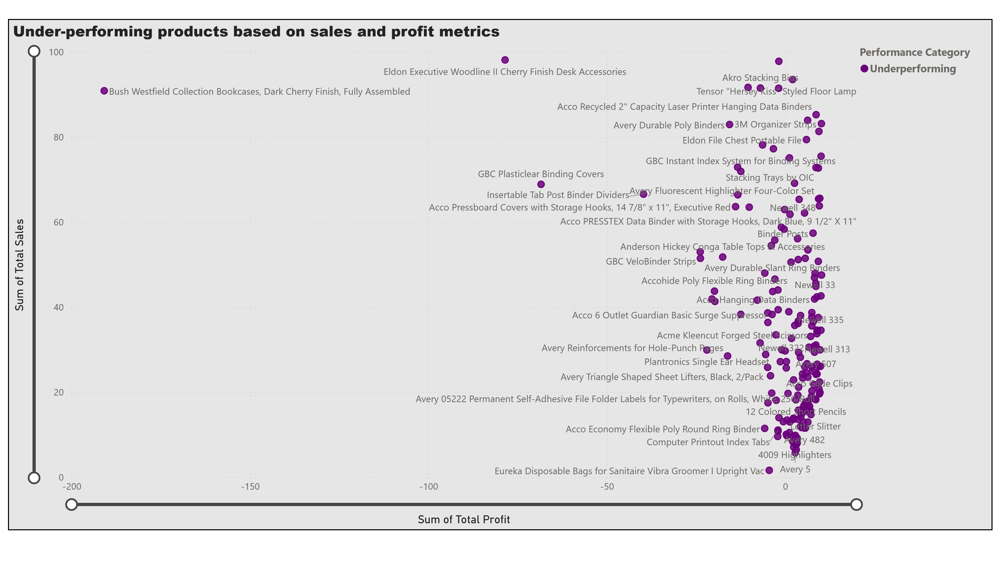

The analysis identified a group of underperforming products that recorded both low sales and negative profits, placing them in the bottom quartile for performance. These products not only failed to generate significant revenue but also operated at a loss, raising concerns about their viability in the current product lineup.

Some notable underperformers include:

Bush Westfield Collection Bookcases posted a loss of nearly $191 despite modest sales around $90, suggesting high cost or poor pricing strategy for furniture items.

Office accessories such as Eldon Cherry Finish Desk Accessories and GBC Plasticlear Binding Covers also registered negative profits, likely due to low demand or narrow margins.

Insertable Tab Post Binder Dividers, VeloBinder Strips, and Avery Slant Ring Binders had sales under $70 and consistently lost money, making them strong candidates for review or discontinuation.

Even low-cost tech items like the Plantronics Single Ear Headset and Texas Instruments TI-15 Calculator showed negative returns, suggesting they might be underpriced or burdened by high acquisition or operational costs.

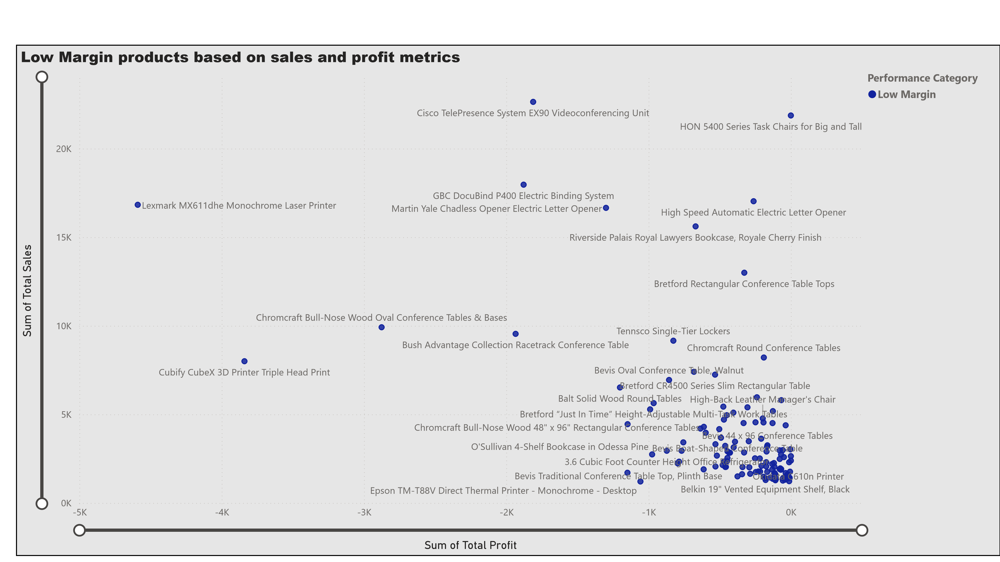

Low-margin products are those with relatively high sales but disproportionately low profit, signaling a potential imbalance between cost and revenue. These items may generate revenue volume but contribute little or even negatively to overall profitability. In our analysis, such products may not fall into the “underperforming” category strictly by sales, but their tight or negative margins raise strategic concerns.

These products often face issues like: Excessive discounting or promotional pricing, High supply chain or fulfillment costs and Inadequate pricing relative to their market value

In the Sunburst chart provided, this analysis is visually represented through a hierarchical breakdown of product categories and subcategories, with color gradients indicating profitability. Products in green shades are high performers, showing strong profit margins, while those in red indicate losses or low profitability.

High-performing products, such as those in the Technology category—particularly Phones and Accessories—stand out due to their consistent sales and high profit margins. These products are likely well-aligned with market demand, priced effectively, and efficiently managed in terms of cost. Their success suggests that the company should consider investing more in these areas, possibly expanding the product range or increasing marketing efforts to capitalize on their popularity.


In [ ]:
import pandas as pd
import plotly.express as px

# Sample DataFrame (replace this with your actual data loading step)
df = pd.read_csv("/content/final_df.csv")

# Example filtering or cleaning (if needed)
df = df.dropna(subset=['Category', 'Sub-Category', 'Product Name', 'Sales', 'Profit'])

# Build Sunburst Chart
fig = px.sunburst(
    df,
    path=['Category', 'Sub-Category', 'Product Name'],  # Hierarchical levels
    values='Sales',                                     # Size of segments
    color='Profit',                                     # Color based on profit
    color_continuous_scale='RdYlGn',                    # Green = high profit, Red = loss
    title='Sales and Profit Analysis by Product Hierarchy'
)

fig.update_layout(margin=dict(t=50, l=30, r=30, b=10))
fig.show()


On the other hand, underperforming products, such as certain items in the Furniture category—like Tables or Bookcases—are marked in red, indicating negative profit margins. These products may suffer from high production or shipping costs, low sales volume, or pricing issues. Identifying these weak spots allows the company to take corrective actions, such as reevaluating pricing strategies, improving supply chain efficiency, or even discontinuing unprofitable items.

Overall, this Sunburst chart analysis empowers decision-makers to allocate resources more effectively, optimize their product portfolio, and enhance overall profitability by focusing on what works and addressing what doesn’t


#### Interesting Patterns Observed:
The core objective of this analysis - turning transactional data into actionable insights — has been effectively achieved through the classification of products based on sales and profit performance.

By identifying high-performing products (e.g., Canon imageCLASS 2200 Copier, HP Designjet T520, and Fellowes Punch Binder), we now have a clear view of top-value drivers. These products can be:
1. Prioritized in marketing campaigns to boost their visibility even further.
2. Supported in logistics planning to ensure inventory levels match demand.
3. Considered for premium pricing strategies, given their strong market response and profitability.

Conversely, the identification of underperforming products (e.g., GBC Binding Covers, Insertable Dividers, Plantronics Single Ear Headset) reveals:
1. Opportunities for cost reduction or SKU(Stock Keeping Unit) rationalization in logistics.
2. Candidates for promotional discounts or bundling strategies to clear slow-moving stock.
3. Insights to inform pricing reviews if margins are too tight or negative.

Additionally, the pattern analysis—such as low-tech office supplies being frequent underperformers—can help in reallocating marketing spend or phasing out low-value categories, which is a direct application of data in strategic decision-making.

From a strategic standpoint, low-margin products can:
1. Drain resources (e.g., warehousing, handling) without adequate return
2. Mask true profitability in portfolio-level reports
3. Offer opportunities for price optimization, cost renegotiation, or packaging and bundling strategies to improve value delivery

Analyzing and isolating these products enables targeted actions, such as revising pricing models, reducing overhead costs, or even eliminating low-value SKUs, to boost overall profit efficiency without compromising customer options.

### Objective 3- Evaluate the impact of discounts on profitability across product categories.

The code to create this objective can be found in the Objective_3_BubbleChart.tgz and Objective 3_ViolinPlot.ipynb

In ObservableHQ, the process begins by loading a CSV dataset using either FileAttachment or d3.csv(), allowing the data to be parsed and made available for analysis. The dataset is then grouped by the "Sub-Category" field using d3.rollups(), and summary statistics such as average discount, average profit, average profit margin, total sales, and record count are calculated for each group. The results are transformed into a cleaner format using .map(), producing an aggregated array where each entry represents a sub-category enriched with its corresponding metrics and category label. To enable interactive data exploration, an input dropdown is created using Inputs.select() and assigned to a view element named selectedCategory. This dropdown dynamically lists all unique categories from the dataset, along with an "All" option, allowing users to filter the data by category. A reactive cell listens to the user's selection and filters the aggregated data accordingly—displaying either all records or only those matching the selected category. Thanks to Observable’s reactive programming model, any changes in the dropdown instantly trigger updates to dependent variables and visualizations, enabling a smooth, interactive, and user-friendly data analysis experience.

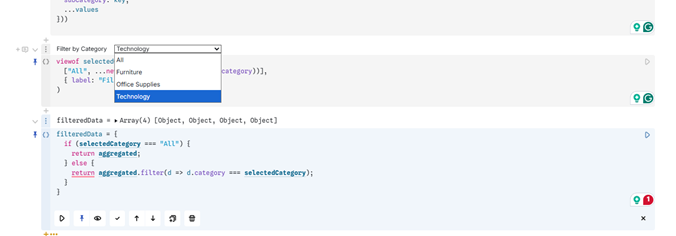

This cell defines a reactive variable filteredData that filters the aggregated dataset based on the user's selection from the selectedCategory dropdown. If the selected value is "All", it returns the entire aggregated dataset. Otherwise, it filters and returns only those records whose category matches the selected value. This logic enables dynamic data filtering in ObservableHQ, where any visualizations or calculations that depend on filteredData will automatically update when the user changes the dropdown selection.

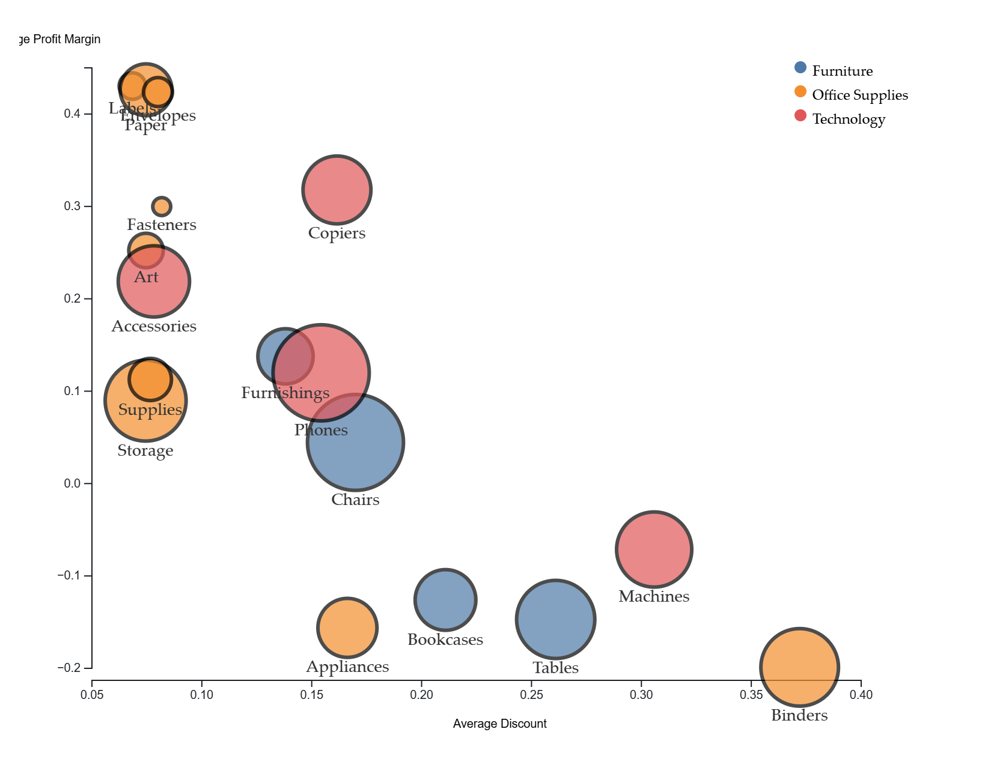

This chart2 cell in ObservableHQ creates an interactive bubble chart using D3.js to visually compare sub-categories based on average discount (x-axis), average profit margin (y-axis), total sales (bubble size), and category (bubble color). It uses the filteredData variable to reflect real-time changes based on the user-selected category. Scales are defined for positioning (x, y), bubble size (r), and color (color). A tooltip displays detailed information on hover, and each bubble has a thicker black border (stroke-width: 3) for better visibility. Labels show sub-category names, and a color legend helps users identify the category associated with each color. Overall, the chart offers a clean and dynamic way to explore sales and profit patterns interactively.


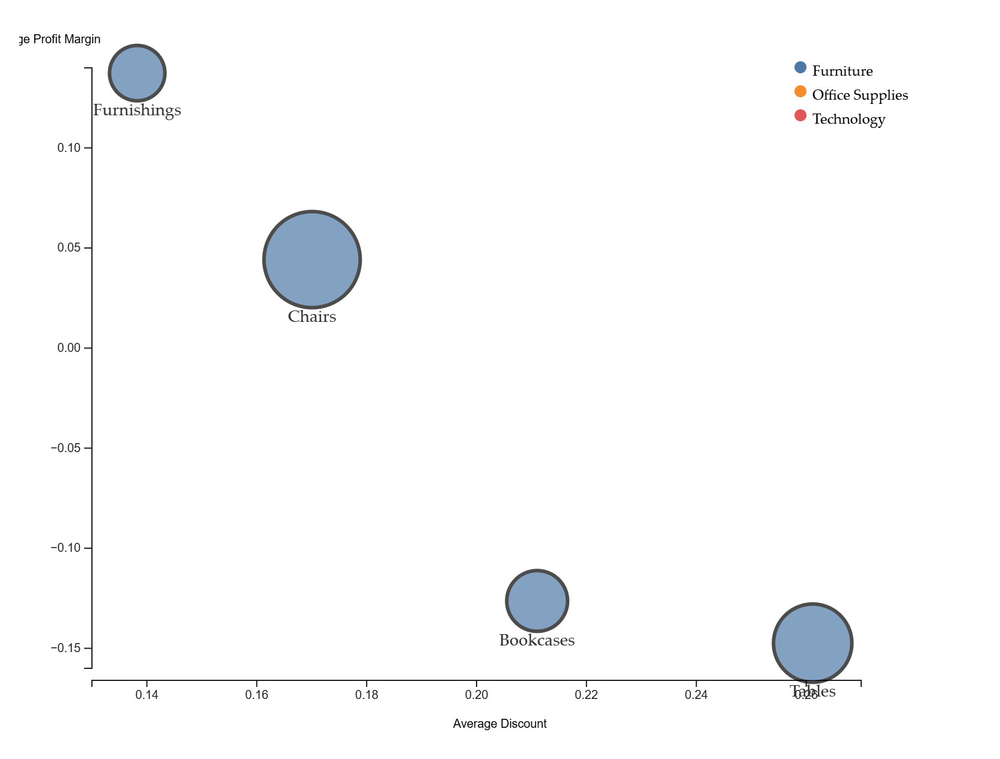



The Furniture category includes at least four visible sub-categories: Furnishings, Chairs, Bookcases, and Tables.

Profitability:
1. Furnishings has the highest average profit margin among all, indicating it’s the most profitable sub-category within Furniture.
2. Chairs shows a moderate positive margin, suggesting a healthy level of profitability.
3. Bookcases and Tables have negative average profit margins, which may imply these sub-categories are being sold at a loss or with very low margins, possibly due to over-discounting or high costs.

Discount Strategy:
1. Tables and Bookcases have higher average discounts, which likely contributes to their low or negative profit margins.
2. Furnishings receives the lowest average discount, aligning with its higher profit margin — a potential sign of premium pricing or less reliance on promotions.

Sales Volume:
1. Chairs has the largest bubble, indicating the highest total sales volume among the sub-categories — it's a key revenue driver, even if not the most profitable.
2. Bookcases and Tables also have substantial sales but combined with low margins, suggesting a need to reevaluate pricing or cost structure.
3. Furnishings has smaller sales volume despite high margins — potentially an under-leveraged opportunity.

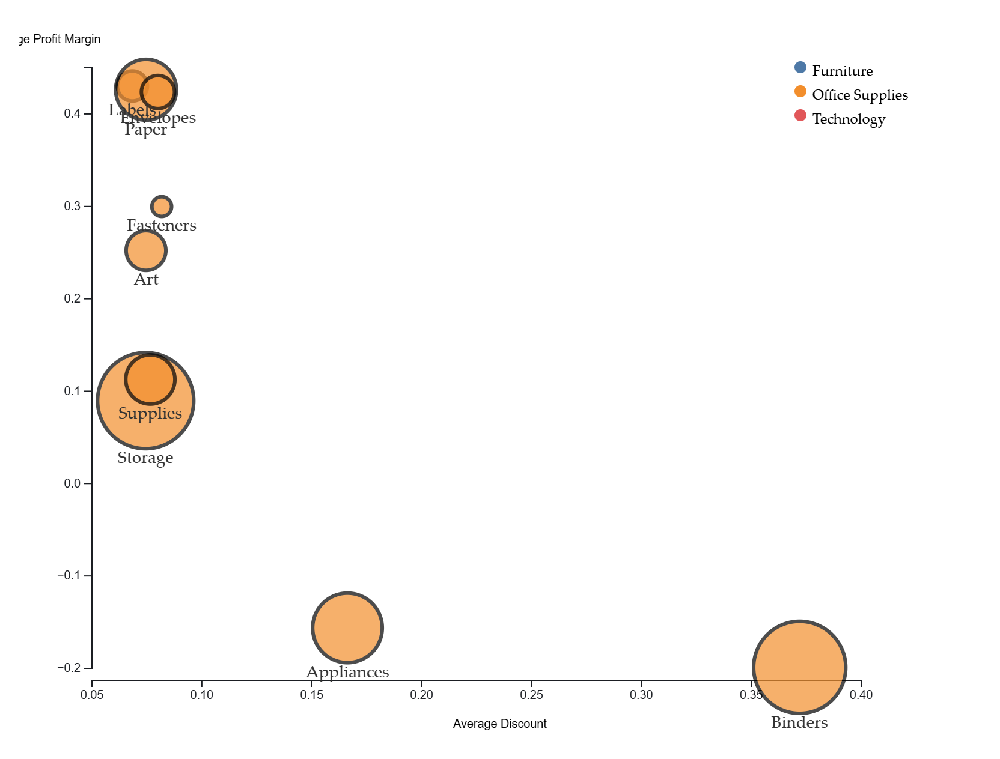

Office Supplies
1.  Sub-Categories with High Profit Margins:Labels, Envelopes, and Paper stand out with very high average profit margins (around 0.4), and they receive low average discounts, making them highly profitable. These are likely small, low-cost items that are not heavily discounted but yield solid profits — ideal products to promote or bundle.

2. Low-Margin or Loss-Making Sub-Categories: Appliances and Binders have negative profit margins despite large sales (as shown by the large bubble sizes), and they are heavily discounted. This suggests over-discounting or high cost structures — areas needing immediate pricing strategy review or cost optimization.

3. Sales Volume Leaders: Binders and Supplies have the largest bubbles, meaning they drive a significant portion of sales volume.

4. While Supplies has a modest but positive profit margin, Binders is a concern , its high discount (~0.38) and negative margin (~–0.2) make it a top candidate for margin recovery efforts.

5. Sub-categories like Fasteners, Art, and Storage have moderate margins and lower discounts, but their sales volume appears low — suggesting potential for expansion through marketing or bundling.

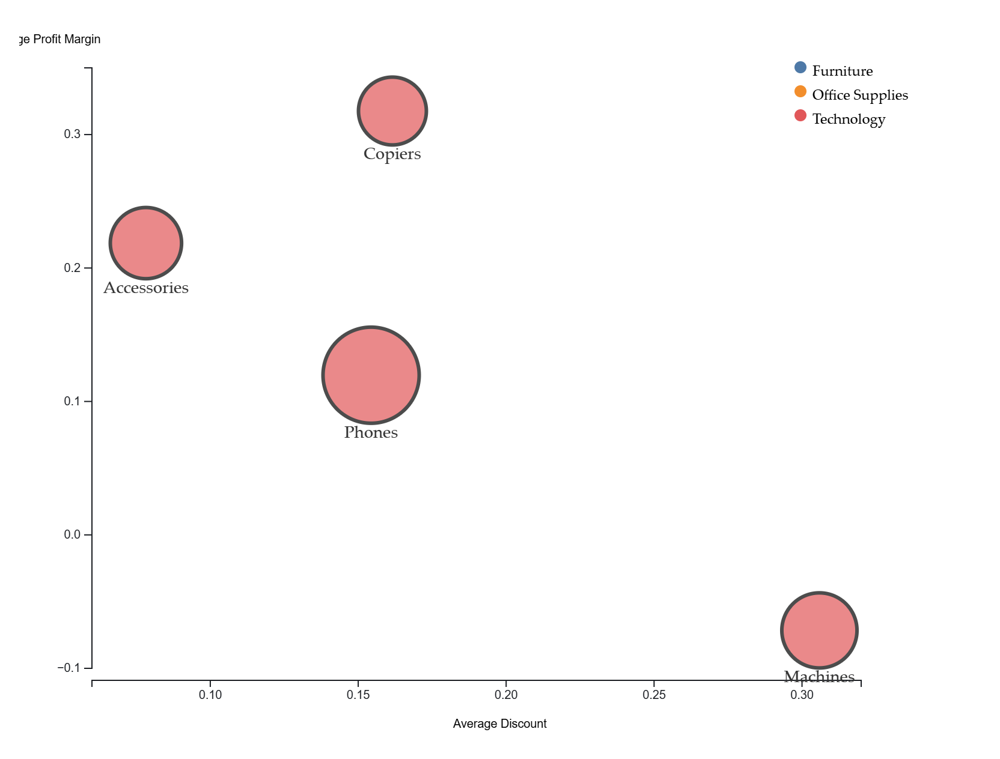

The bubble chart visualizes product sub-categories within the Technology category:
1. Phones have the highest sales volume despite offering moderate discounts ~15% and earning a relatively low profit margin ~12%.

2. Copiers are the most profitable sub-category with the highest profit margin ~32% and moderate discounts ~17%, though their total sales are not the highest.

3. Accessories achieve strong profit margins ~22% while maintaining low discount levels ~8%, indicating an efficient pricing strategy.

4. Machines show the highest discount 31% but suffer from a negative profit margin (-1%), making them the least profitable despite moderate-to-high sales.


The graph shown is a Violin plot (or swarm plot) created using ploty that illustrates the distribution of profit across three major product categories—Furniture, Office Supplies, and Technology—with each data point representing an individual product transaction. The x-axis lists the product categories, while the y-axis shows the profit value associated with each transaction. The data points are colored based on the discount percentage applied, as indicated by the legend on the right.

In the Furniture category, profit values are generally clustered near the lower range with relatively limited variation. There are a few negative profit instances, especially for higher discount values (such as 0.5 and 0.6), suggesting that heavy discounts may not be sustainable for profitability in this category. However, the category overall appears more stable, with fewer extreme profit outliers, indicating a more predictable margin structure.

The Office Supplies category displays a more varied profit distribution. A significant number of profitable transactions are observed even at zero or low discount levels (0.0, 0.1, 0.15). Nonetheless, some sharp dips into negative profit are visible, particularly when higher discounts (like 0.4 and above) are applied. This indicates that while office supplies can be sold profitably, discounts beyond a certain threshold tend to erode profitability quickly.

In [ ]:
fig = px.violin(
    df, y='Profit', x='Category', color='Discount',
    box=True, points='all', hover_data=['Product Name'],
    title='Profit Distribution per Category by Discount'
)
fig.show()

The Technology category exhibits the widest spread of profit values, ranging from highly profitable sales to large losses. There is a noticeable pattern where many of the most negative profit outcomes are tied to higher discount levels (such as 0.7, 0.5, and 0.8), clearly indicating that aggressive discounting in the technology category leads to significant financial losses. On the other hand, some of the highest profit outliers also come from this category when no or low discounts are applied, suggesting potential for high margin products if discounting is controlled.

In summary, the strip plot reveals that discounting has a measurable and often negative impact on profit, especially in categories like Technology and Office Supplies. Lower or no discounts generally correlate with positive profits, while higher discounts often lead to losses, particularly in Technology. These insights can help businesses tailor their pricing and discount strategies more effectively by identifying underperforming segments and reinforcing investment in high-performing products.

#### Interesting Patterns

For the furniture category, There is a need to maintain or expand Furnishings as it is a high margin product.However, monitor Chairs is recommended as high sales, moderate profit; optimize pricing to improve margin.Reassess Bookcases and Tables — low or negative margin despite sales; consider reducing discounts or lowering cost of goods sold.

For the Office Supplies, There is a need to protect and promote high-margin items like Labels, Paper, Envelopes, reevaluate pricing and cost structure for Binders and Appliances — focus on margin recovery, Boost visibility and sales of profitable but underperforming products (e.g., Fasteners, Art), and finally consider reducing discounts on top-selling items if profit margins are being compromised.

Under the technology category,  We see that higher discounts tend to reduce profit margins, as seen with Machines. Copiers and Accessories provide a healthy balance between discounting and profitability. Phones generate the most revenue but yield thinner profits. Machines need a pricing or cost strategy review due to consistent losses despite strong sales.

### Objective 4- Analyze order and shipping timelines to assess operational efficiency.

The code to create this objective can be found in the Objective_4_Heatmap.tgz

The primary objective of this analysis is to assess operational efficiency by evaluating the shipping timelines across different product categories and geographic regions. By examining the delay between the order date and the shipping date, we can uncover patterns in performance, identify bottlenecks, and pinpoint regions or categories that require process improvement. A heatmap visualization serves as an effective tool to present this multi-dimensional data compactly, highlighting variations in average shipping delays.
The dataset used for this analysis contains historical order-level information, including fields such as Order Date, Ship Date, Region, and Category. The data is assumed to be loaded in an Observable cell named data. Each record represents an individual order and contains textual date fields that need to be parsed into JavaScript Date objects for analysis.
To calculate the shipping delay, the following steps were taken:
Iterate over each row in the dataset.
Convert the Order Date and Ship Date strings into valid Date objects.
Subtract the order date from the shipping date to calculate the delay in days.
Filter out invalid or negative delay values to ensure data quality.
Once valid delays were extracted, we used the d3.rollup() function to compute the average shipping delay for each combination of Region and Category.
The heatmap visualization plays a crucial role in supporting business decision-making related to shipping efficiency and product availability across regions. By displaying the average shipping delay for each combination of region and product category, the heatmap provides an immediate, visual summary of operational performance. Business teams can quickly identify which regions consistently experience longer delays for specific product categories, signaling potential issues in logistics, inventory distribution, or regional warehousing. For example, if the Technology category in the South region shows a consistently higher delay, it may prompt investigation into local supplier efficiency, shipping partners, or fulfillment center stock levels. Conversely, cells with low delays reflect strong logistical performance, which can serve as benchmarks for other areas.
Additionally, the heatmap can reveal gaps in product availability — empty or gray-colored cells may indicate that certain categories are not being shipped to specific regions, which could represent missed sales opportunities or limited market penetration. This insight allows the business to assess whether the lack of data is due to supply constraints, demand issues, or strategic distribution choices. Ultimately, the heatmap serves as a decision-support tool that bridges data analysis with action, helping operations, sales, and logistics teams align strategies to improve customer satisfaction, optimize inventory, and reduce delivery time across all regions.

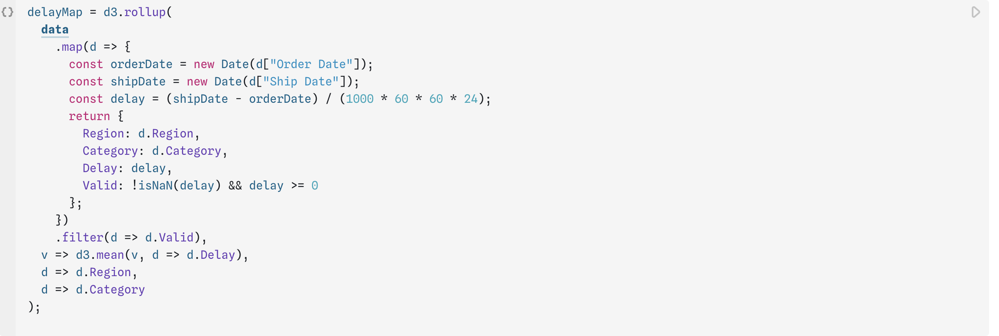

The code snippet constructs a structured dataset heatmapDataComplete by mapping over all possible combinations of Region and Category. For each pair, it looks up the corresponding average shipping delay from a nested map delayMap and assigns it to the AvgDelay field. If no delay value exists for a particular combination, it assigns null, which helps ensure that the heatmap can accurately represent all region-category pairs—even when data is missing. This step is essential to avoid gaps in the visualization and maintain completeness of the heatmap.
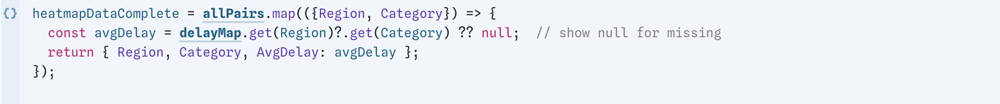

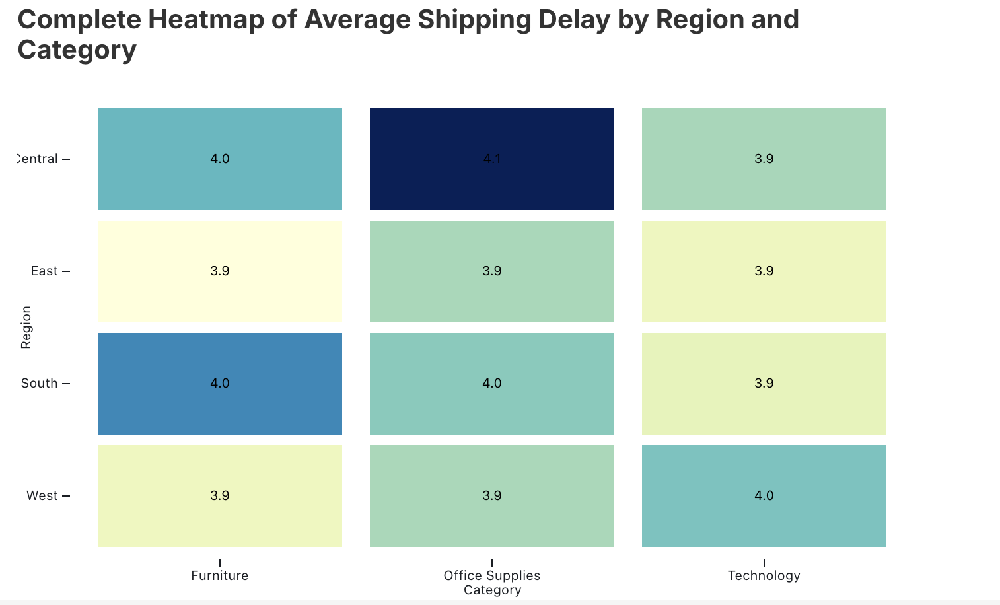


Each cell in the heatmap represents the average shipping delay (in days) for a specific combination of region and product category. The numeric value is easy to interpret at a glance, and the color intensity gives a visual cue—darker shades indicate higher delays, while lighter shades suggest better performance.
For example:
Central region – Office Supplies has the highest delay (4.1 days), which stands out due to the darkest color.
All other categories and regions hover around 3.9–4.0 days, indicating relative consistency.
This allows teams to instantly pinpoint operational bottlenecks or regions/categories where logistics need improvement.
From a business standpoint, decisions should focus on balancing regional supply chain efficiencies, improving inventory allocation strategies, and streamlining distribution processes. For instance, the company might consider increasing fulfillment resources in the Central region, revisiting vendor performance in Office Supplies, or implementing predictive demand planning tools. Additionally, since delays are relatively uniform in other regions, leadership can explore benchmarking best practices from those areas to standardize performance nationwide.
While the heatmap has been instrumental in diagnosing surface-level delays, it also opens avenues for further granular analysis such as:
Evaluating delays by shipping mode (standard vs. express),
Investigating delivery performance by top-selling SKUs,
Monitoring seasonal trends or external disruptions (e.g., weather or labor shortages).


By using the heatmap to localize issues and prioritize data-driven actions, the business can move toward a more resilient and responsive supply chain model.

##### Improvement Plans
1 Audit Central region logistics operations—check for inventory shortages, processing delays, or transportation issues.

2 Evaluate supplier lead times for Office Supplies and consider dual sourcing to avoid bottlenecks.

3 Implement regional performance tracking with alerts for deviations in delivery times.

4 Introduce automation in fulfillment centers to speed up order picking and packing.

5 Rebalance warehouse inventory across regions based on demand forecasts and delivery patterns.

6 Enhance carrier performance SLAs and consider alternative logistics providers in underperforming regions.

7 Regularly update the heatmap dashboard to track post-implementation performance improvements.



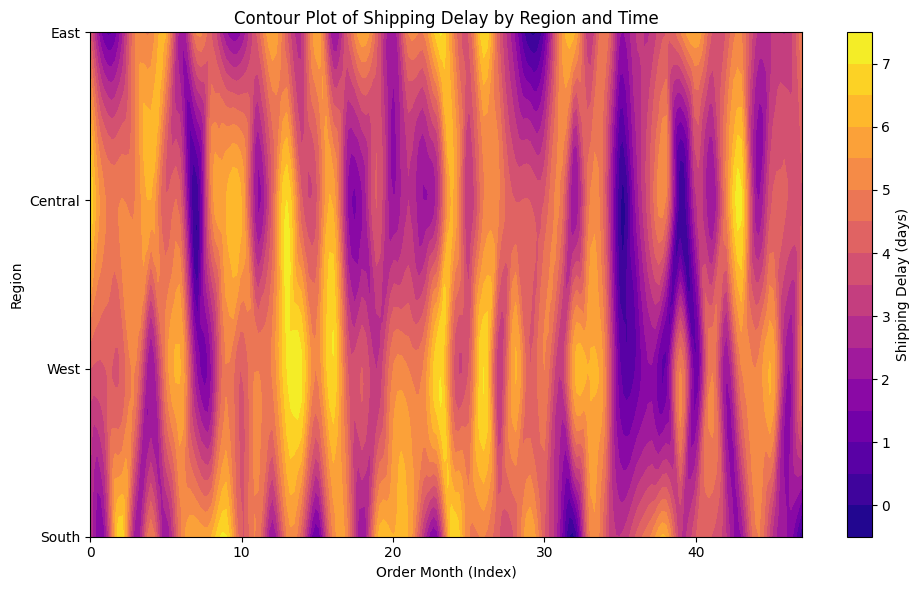

In [ ]:
# Extract order month
df['OrderMonth'] = df['Order Date'].dt.to_period("M").astype(str)
df['MonthIndex'] = pd.factorize(df['OrderMonth'])[0]

# Factorize Region
df['RegionIndex'], region_labels = pd.factorize(df['Region'])

# Filter to valid shipping delay values
df = df.dropna(subset=['Shipping_Delay'])

# Assign coordinates
x = df['MonthIndex']             # Time as numeric index
y = df['RegionIndex']            # Regions as numeric values
z = df['Shipping_Delay']         # Contour level = delay

# Create mesh grid
xi = np.linspace(x.min(), x.max(), 200)
yi = np.linspace(y.min(), y.max(), 200)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((x, y), z, (xi, yi), method='cubic')

# Plot contour
plt.figure(figsize=(10, 6))
contour = plt.contourf(xi, yi, zi, levels=15, cmap='plasma')
cbar = plt.colorbar(contour)
cbar.set_label('Shipping Delay (days)')

# Label axes
plt.xlabel('Order Month (Index)')
plt.ylabel('Region')
plt.title('Contour Plot of Shipping Delay by Region and Time')

# Replace Y-axis ticks with Region names
plt.yticks(ticks=np.arange(len(region_labels)), labels=region_labels)

plt.tight_layout()
plt.show()

This contour plot shows how shipping delays varied over time across different regions—South, West, Central, and East. The x-axis represents time in months (indexed numerically), while the y-axis lists the regions. The color gradient reflects the average shipping delay in days, with brighter colors (yellow) indicating longer delays and darker shades (purple) showing shorter delays.

From the plot, it's clear that shipping delays fluctuated over time in all regions, with noticeable spikes in delay at several points, particularly in the Central and West regions. These areas experienced more frequent and intense peaks, suggesting possible seasonal congestion or logistical issues. In contrast, the East and South regions showed more consistent performance, though occasional delays still occurred. Overall, the plot helps identify which regions faced the most significant delays and when those delays happened, offering valuable insight for improving delivery operations and planning.

### Objective 5 -Segment customers (Consumer, Corporate, Home Office) to understand behavior and purchasing trends.

The code to create this objective can be found in the Objective_5_Chord_Diagram_StackedBarChart.tgz and Objective_5_StackedAreaChart.pbix

To visualize the relationships between customer segments and product categories using a chord diagram, we begin by aggregating the data. Using D3's d3.rollup function, the sales values are grouped by Segment and Category, with the total sales calculated for each pair. This results in a nested structure that is then flattened into an array of objects, where each object represents a directional connection from a segment (source) to a category (target) with an associated sales value.

Next, a unique list of nodes is extracted from the source and target fields. These nodes represent the distinct entities (segments and categories) that will be shown as arcs around the chord diagram. A square matrix is then constructed to define the relationships between all node pairs. Each cell in this matrix represents the sales value flowing from one node to another. If no relationship exists between two nodes, the corresponding matrix entry is set to zero. This matrix structure is required by D3’s chord layout generator.

The chord diagram is then created using D3’s chord, arc, and ribbon generators. Arcs are drawn for each node around a circle, and ribbons connect the nodes to illustrate the magnitude of sales flowing between them. The width of each ribbon corresponds to the sales volume, and a color scale is used to differentiate the nodes. Labels and tooltips are added to enhance interpretability, showing detailed information on hover.


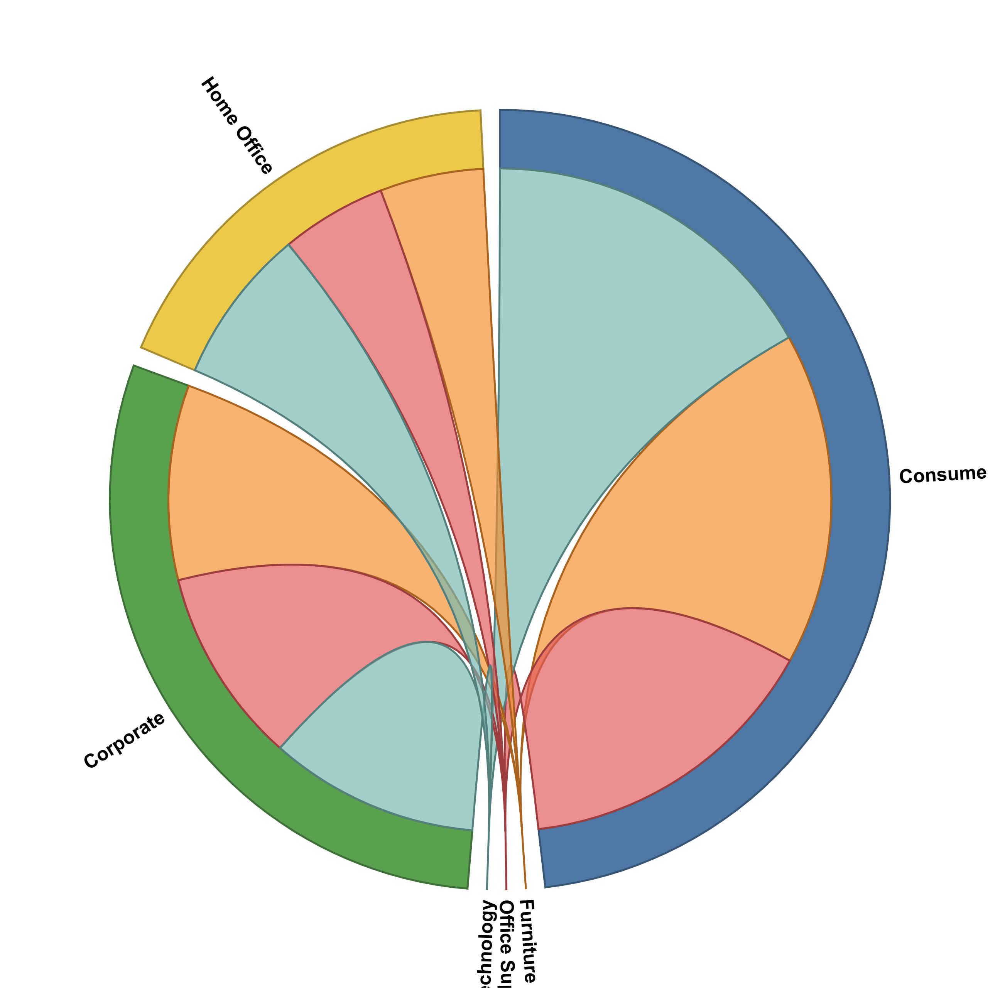

The chord diagram visualizes the relationship between customer segments and product categories through arcs and ribbons. The arcs around the circle represent the different nodes. Customer segments, such as Corporate and Home Office, are positioned on the left, while product categories like Furniture, Office Supplies, and Technology are on the right. The width of each arc corresponds to the total sales associated with that segment or category, with wider arcs indicating higher sales volumes. For instance, the Consumer segment, shown as a blue arc, is the widest, signifying it contributes the most to overall sales. Inside the circle, curved ribbons illustrate the flow of sales from each segment to each product category. The thickness of these ribbons reflects the volume of sales between the connected nodes; the thicker the ribbon, the greater the sales. Additionally, ribbons are colored based on the target category, allowing for easier visual tracking of how each segment’s revenue is distributed across product categories.


The chord diagram effectively illustrates how sales are distributed from customer segments to product categories by combining both overall volumes and relational flows in a single visual. The Consumer segment contributes significantly to all three categories, Technology, Office Supplies, and Furniture, with a particularly strong emphasis on Technology, as indicated by both the wide arc and thick ribbons leading to that category. The Corporate segment also shows strong contributions across all categories, though at a slightly lower level than Consumer, while Home Office has the smallest arc, reflecting its relatively lower total sales. On the category side, Technology receives the largest share of sales across all segments, followed by Office Supplies and then Furniture. The widths of the arcs represent total sales per segment or category, while the curved ribbons between them visually convey how those sales are shared. This makes the chord diagram an intuitive and powerful tool for understanding not just the size of each group, but also the distribution and strength of connections between segments and product categories.

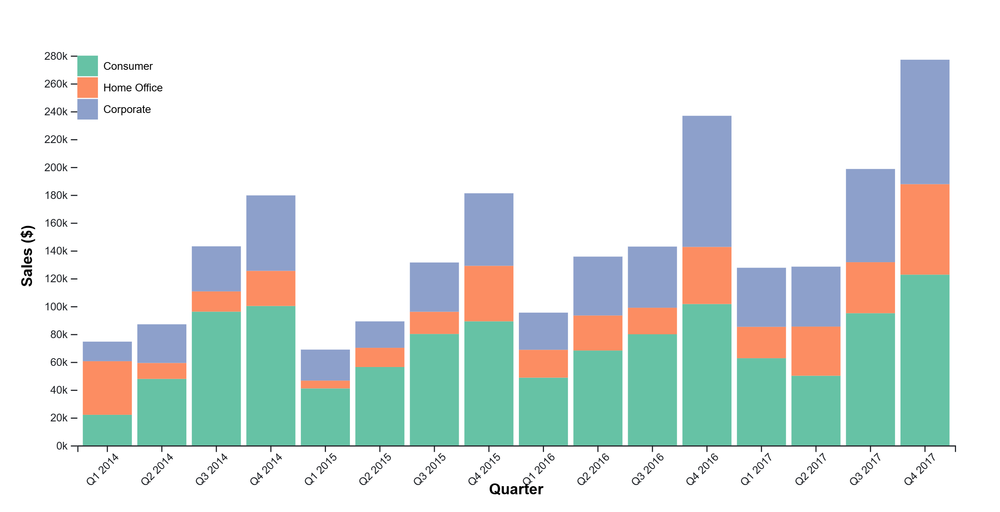

The stacked bar chart illustrates quarterly sales trends from 2014 to 2017, with each bar representing total sales for a specific quarter. Within each bar, the sales are divided by customer segments, Consumer, Corporate, and Home Office, using different colors. This allows for easy comparison of how each segment contributes to total sales across different quarters. The chart highlights seasonal patterns, such as consistently higher sales in Q4, and shows that the Consumer segment contributes the largest share overall.

To ensure that the quarters are displayed in the correct chronological order, a custom sort column was created. This new column, often named something like "Order_Sort," was calculated by combining the year and quarter as a numeric value (e.g., 201401 for Q1 2014). Power BI was then instructed to sort the "Order_Quarter" labels using this numeric column. This step is crucial because without it, Power BI would sort the quarters alphabetically (e.g., Q1 2014 before Q2 2013), leading to an inaccurate time sequence in the visualization.


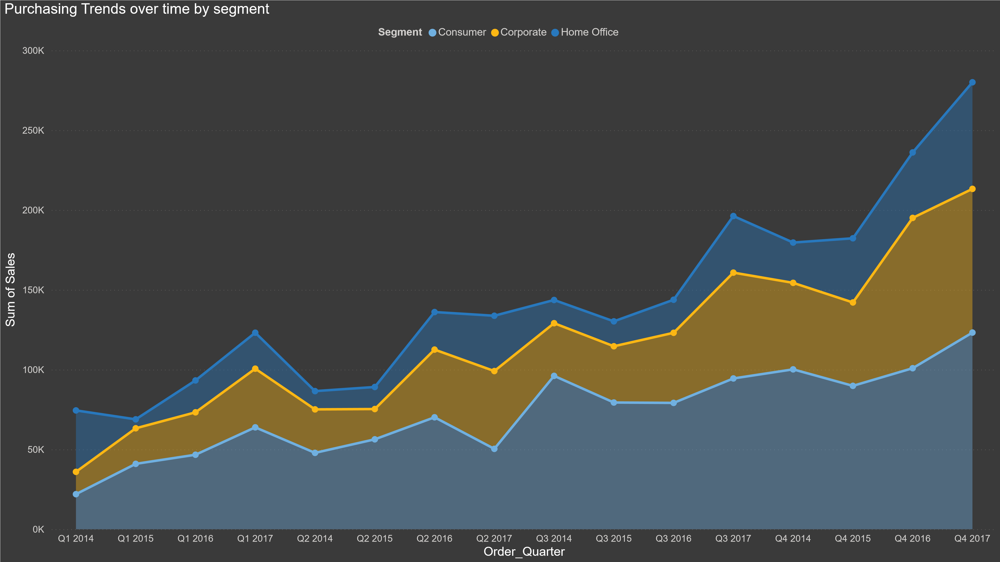

The stacked area chart displays quarterly sales trends over time from Q1 2014 to Q4 2017, with sales divided by customer segments: Consumer (blue), Corporate (orange), and Home Office (gray). Each area represents the sales contribution of a segment, and the combined height of all areas at each point represents the total sales in that quarter.

The chart shows a clear upward trend in total sales over the four-year period. The Consumer segment consistently contributes the largest share of sales, evident from the prominent blue area at the top. Corporate and Home Office also show steady growth, with Corporate gradually increasing its share over time. Sales peaks are visible in several quarters, especially Q4 periods, indicating seasonal spikes. The visual helps track both the growth in overall sales and how each segment’s share changes over time.

### Objective 6-Examine regional sales patterns across U.S. states and regions to uncover geographic insights.

The code to create this objective can be found in the Objective_6_Choropleth_TreeMap.tgz

The choropleth map presents a clear visualization of sales distribution across the United States by state. The data reveals significant regional disparities, with California leading by a substantial margin at \$457,688 in sales, followed by Texas and New York, which record \$170,188 and \$310,876 respectively. These three states stand out as major sales hubs, as indicated by the darkest blue shading, demonstrating strong market demand and possibly more established sales infrastructure. Other states with relatively high sales figures include Washington (\$138,641), Pennsylvania (\$116,512), Florida (\$89,474), Michigan (\$76,270), Illinois (\$80,166), and Ohio (\$78,258), all showing moderate to strong performance compared to the national landscape.

In contrast, a considerable number of states reflect much lower sales volumes, as indicated by the lighter shades of blue or near-white color. States like North Dakota (\$920), South Dakota (\$1,316), Kansas (\$2,914), West Virginia (\$1,210), and Maine (\$1,271) exhibit very low sales numbers, suggesting under-penetrated markets or less effective sales outreach. Additionally, Alaska and Hawaii report zero sales, which may point to distribution challenges or lower market prioritization. Several other states, primarily in the central and northern regions, fall into the low-to-moderate sales range, indicating room for growth and increased market engagement.

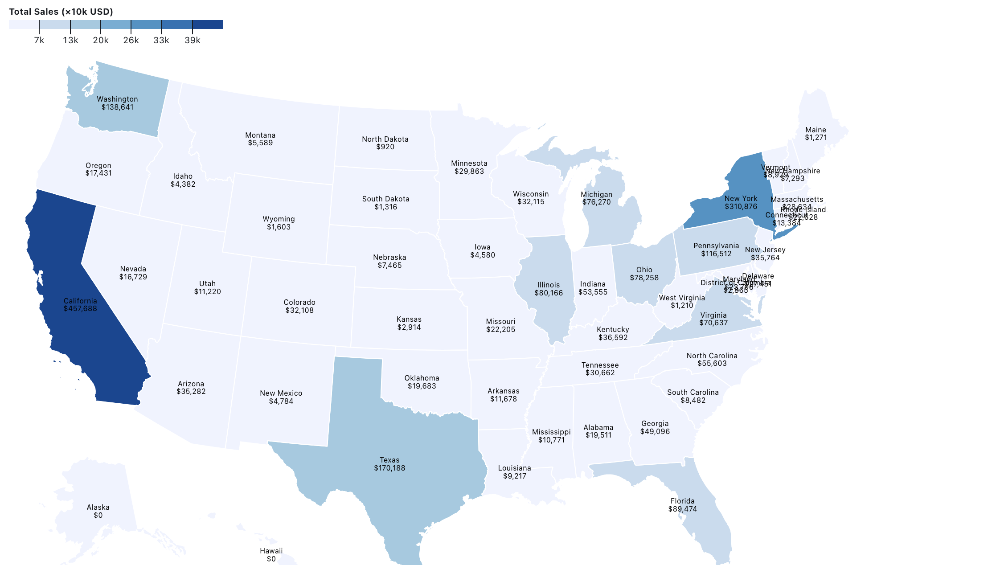

This uneven sales distribution points to potential strategic opportunities for growth by focusing efforts on the underperforming states. Expanding distribution channels in these regions could enhance product availability, while targeted marketing campaigns tailored to local preferences might increase customer awareness and engagement. Conducting market research in low-sales states can also help uncover specific barriers such as product fit, pricing sensitivity, or competitive dynamics that limit sales. Furthermore, incentivizing and empowering local sales teams with resources and rewards could drive improved performance. Engagement with communities through sponsorships and partnerships could also foster brand loyalty in these lesser-performing markets.

Overall, the map’s visual insights emphasize the importance of a regionally differentiated strategy to optimize sales growth nationwide. While major states like California and New York remain critical to overall revenue, there is considerable untapped potential in many other states that, if addressed strategically, can contribute significantly to long-term business expansion and market share growth. By prioritizing investment and resources in these lower-performing areas, companies can build a more balanced and resilient sales network across the United States



The treemap provided is a graphical representation of data distributed across U.S. states, where each state is depicted as a rectangle. The size of each rectangle corresponds to a numerical value, likely representing financial figures such as revenue, expenditure, or investment. This method of visualization allows for an immediate understanding of how values compare across different categories—in this case, states.

From the treemap, it's evident that California holds the largest value at \$457,688, making it the most dominant state in this dataset. New York follows with \$310,876, and Texas with \$170,188, indicating that these states are either contributing or receiving significantly more than others. Washington and Pennsylvania also show substantial values, suggesting their importance in the overall distribution.

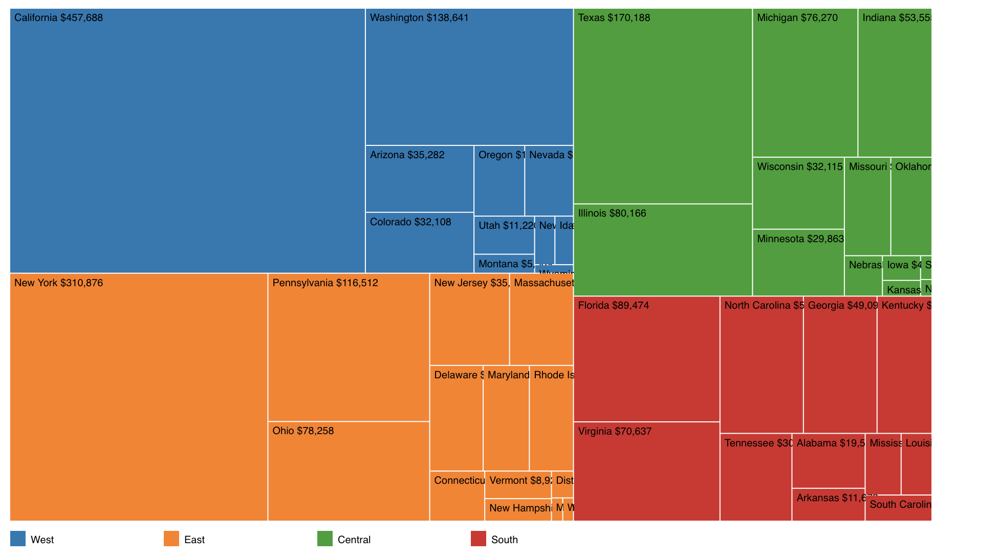

n contrast, Midwestern states like Indiana (\$53,555), Ohio (\$78,258), and Illinois (\$80,166) have moderate values, while states such as Wisconsin (\$32,115) and Minnesota (\$29,863) are on the lower end. Some states have values that are partially obscured or too small to read, which may indicate either lower figures or limitations in the visualization's resolution.

Overall, the treemap effectively highlights disparities and concentrations in the data, making it a useful tool for identifying regional trends and outliers.

##### Improvement Plan for Increasing Sales Across Underperforming States
1. Market Research and Analysis

Conduct detailed market research in low-sales states (e.g., North Dakota, South Dakota, Kansas, West Virginia, Maine) to identify key barriers such as customer preferences, pricing challenges, competitive landscape, and product-market fit.

Analyze demographic, economic, and cultural factors that may influence sales performance in these regions.

2. Enhance Distribution and Accessibility

Expand distribution channels in under-penetrated markets to improve product availability and reduce logistical barriers.

Explore partnerships with local distributors, retailers, or e-commerce platforms to increase reach.

Evaluate potential for local warehousing or regional fulfillment centers to speed delivery.

3. Tailored Marketing Campaigns

Develop targeted marketing strategies customized for regional preferences, using localized messaging, offers, and channels (e.g., local radio, social media groups, events).

Increase digital marketing focus with geo-targeted ads emphasizing product benefits relevant to local consumer needs.

Use data-driven campaigns to measure effectiveness and optimize marketing spend.

4. Sales Team Enablement and Incentives

Empower local sales teams in low-performing states with additional resources such as training, market intelligence, and sales tools.

Implement incentive programs or bonuses to motivate sales reps to grow market share in these regions.

Recruit and onboard local sales talent who understand regional market dynamics and customer behavior.

5. Community Engagement and Brand Building

Invest in community sponsorships, events, and partnerships that resonate with local customers to build brand trust and loyalty.

Collaborate with local influencers or organizations to enhance brand presence and credibility.

Encourage customer feedback and actively respond to regional needs or concerns.

6. Continuous Monitoring and Adaptation

Establish KPIs and dashboards to track sales performance by state regularly.

Use insights to adapt strategies dynamically and address emerging challenges or opportunities quickly.

Conduct quarterly business reviews focused on regional performance and improvement progress.

## Failed Experiments with Visualization

###### Identify high-performing and underperforming products based on sales and profit metrics.


In [ ]:
import pandas as pd
import plotly.express as px

# Load the dataset
final_df = pd.read_csv('/content/final_df.csv')

# Using a pie chart to visualize profit and sales together
# This mixes metrics poorly and hides under/over-performance

fig = px.pie(
    final_df,
    names='Product Name',      # Assuming your CSV has this column
    values='Sales',            # Pie size by Sales
    color='Profit',            # Trying to show profit via color (bad idea here)
    title='Product Sales Share (with Profit as Color)'  # Misleading
)

fig.show()

Why above Visualization Fails

1) Wrong Chart Type:

A pie chart is inappropriate for comparing two metrics like sales and profit simultaneously.

Pie charts work well for part-to-whole relationships but fail to show underperformance trends.

2) Misleading Color Encoding:

Using profit as a color dimension in a pie chart confuses interpretation, since viewers assume the size represents value but color mapping lacks proper legend context.

3) No Clear High vs. Low Performance:

There's no axis or logical ordering to distinguish high or low performance.

Products with negative or zero profit (e.g., Product D, E) are not easily distinguishable.

4) No Combined Metric:

There’s no composite performance metric like "Profit Margin" or "Profit per Sale" that might help identify efficiency.



##### Analyze order and shipping timelines to assess operational efficiency.

In [ ]:
import pandas as pd
import plotly.express as px

# Load your dataset
final_df = pd.read_csv("final_df.csv")

# Group by category and calculate average discount
category_discount = final_df.groupby("Category", as_index=False)["Discount"].mean()

# ❌ BAD Visualization: Line chart for categorical data
fig = px.line(
    category_discount,
    x="Category",
    y="Discount",
    title="Average Discount by Category"
)

fig.show()


Why the Line Chart Failed

1) Incorrect chart type for categorical data: Line charts imply continuous or time-sequential data, but product categories are discrete and unordered, so connecting them with lines is misleading.

2) Shows only one metric: It displays average discount only, without including any profitability data, so the relationship between discount and profit is completely missing.

3) No insight into impact: The chart does not show how discounts affect profitability, which is the key goal of the analysis.

4) False sense of trends: Connecting category points with lines suggests a trend or progression between unrelated categories, which does not exist.

5) No detection of outliers or extremes: It cannot highlight products or categories with unusual discount-profit behavior, which is critical for identifying underperformers or over-performers.



#### Analyze order and shipping timelines to assess operational efficiency.

In [ ]:
import pandas as pd
import plotly.express as px

# Load data (assumes final_df.csv has 'Order Date' and 'Shipping Date' columns)
final_df = pd.read_csv("final_df.csv")

# Convert dates to datetime
final_df['Order Date'] = pd.to_datetime(final_df['Order Date'])
# Shipping Date intentionally ignored here to fail the analysis

# ❌ BAD Visualization: Scatter plot of Orders over time only (no shipping info)
fig = px.scatter(
    final_df,
    x='Order Date',
    y='Product Name',
    title='Order Dates Scatter Plot',
    labels={'Order Date': 'Order Date', 'Product Name': 'Product'}
)

fig.show()


Why scatter Chart Fails for the Objective:

1) Ignores Shipping Timeline: It only shows order dates, completely ignoring shipping dates, which are critical to assess operational efficiency.

2) No Measure of Delay: Without comparing order and shipping times, you can’t evaluate how fast shipments are fulfilled.

3) No Duration Metric: There’s no calculated metric like "shipping delay" or "time between order and ship" to analyze.

4) Poor Use of Scatter Plot: Scatter plots need two related numeric/date variables to show correlation or delay — using only order dates and product names shows just when orders were placed.

5) No Trend or Insight: Cannot spot slow or fast shipping products, bottlenecks, or peak load times.

##### Utilize descriptive and visual analytics to analyze a U.S. office supply retail dataset

In [ ]:
import pandas as pd
import plotly.express as px

final_df = pd.read_csv("final_df.csv")

fig = px.sunburst(
    final_df,
    path=['Category', 'Sub-Category'],
    values='Sales',       # Only showing sales
    title='Sunburst Chart of Sales by Category and Sub-Category'
)

fig.show()


Why the Sunburst Chart Fails

1) Only visualizes one metric (Sales):

The chart focuses only on sales and ignores other important metrics like profit, quantity sold, or discount — missing a multi-dimensional analysis.

2) No temporal context:

It doesn’t show trends over time (e.g., monthly or yearly performance), which is crucial for understanding seasonal or evolving business behavior.

3) No regional or geographic insight:

The objective references a U.S. dataset, yet this chart completely ignores Region or State, losing geographic context.

4) Lacks descriptive summaries:

There are no statistics like average sales, top categories, low-margin segments, etc. — which are essential in descriptive analytics.

5) Difficult to interpret proportionally:

In Sunburst charts, it’s hard to accurately compare segment sizes or understand the scale, especially with nested rings.

6) Doesn’t highlight outliers or inefficiencies:

The chart does not reveal underperforming products or categories with high sales but low profit, missing actionable insights.

7) No customer or behavioral dimension:

It omits customer patterns, repeat orders, or order size behavior — key parts of retail analysis.

8) Visual overload with limited meaning:

While visually appealing, the chart may overwhelm users without delivering meaningful insight or guidance.

